# Growth Mechanism with Details

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import sys
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors
import torch
sys.path.append('../../src')

from m3_learning.viz.layout import layout_fig
from m3_learning.RHEED.Viz import Viz
from m3_learning.RHEED.Dataset import RHEED_parameter_dataset, RHEED_spot_Dataset
from m3_learning.RHEED.Analysis_umich import fit_curves, analyze_rheed_data, select_range, plot_activation_energy
from m3_learning.RHEED.Fitter1D import Model, Multiscale1DFitter


def collect_data(ys_nor_all, mean_length=2000, viz=False):

    ys_all_same_length = []
    for y in ys_nor_all:
        ys_all_same_length.append(np.interp(np.linspace(0, 1, mean_length), np.linspace(0, 1, len(y)), y))

    ys_all_same_length = np.array(ys_all_same_length)
    ys = torch.tensor(ys_all_same_length).float().unsqueeze(1)

    x = np.linspace(0, 1, mean_length)
    x = torch.tensor(x).float().unsqueeze(0)

    xs = x.repeat(ys.shape[0], 1, 1).squeeze().detach().numpy()
    if viz:
        print(xs.shape, ys.shape)
        Viz.plot_fit_details(xs, ys.squeeze().detach().numpy(), ys.squeeze().detach().numpy(), None, mod=5, labels=None, figsize=(12, 1.5*len(xs)//4+1), style='presentation')
    return xs, ys

def viz_fit(model, batch, device):
    inputs = batch[0].to(device).double()
    model = model.to(device).double()
    outputs, unscaled_param = model(inputs)
    labels = []
    for param in unscaled_param:
        labels.append(f'I/I0 = {param[0]:.2f} * 1-exp(-x/{param[1]:.2e})')

    xs = x.repeat(outputs.shape[0], 1, 1).squeeze().detach().cpu().numpy()
    ys = inputs.squeeze().detach().cpu().numpy()
    ys_fit = outputs.squeeze().detach().cpu().numpy()
    # print(xs.shape, ys.shape, ys_fit.shape)
    Viz.plot_fit_details(xs, ys, ys_fit, None, mod=5, labels=labels, figsize=(12, 1.5*len(xs)//4+1), style='presentation')

ModuleNotFoundError: No module named 'm3_learning'

In [2]:
para_path = '../datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5'
ds_para = RHEED_parameter_dataset(para_path, camera_freq=2000, sample_name='J14')
ds_para.dataset_names

['30fps_temp600_later_stage',
 'temp500',
 'temp500_later_stage',
 'temp550',
 'temp550_later_stage',
 'temp600',
 'temp600_later_stage']

temp500-height-spot_1


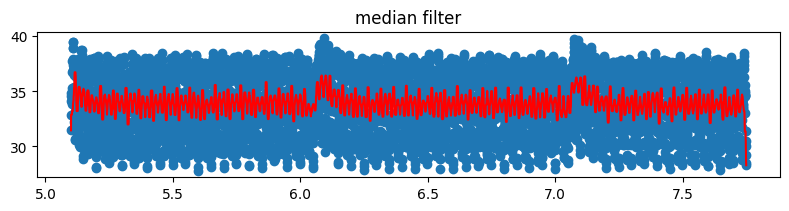

temp500_later_stage-height-spot_1


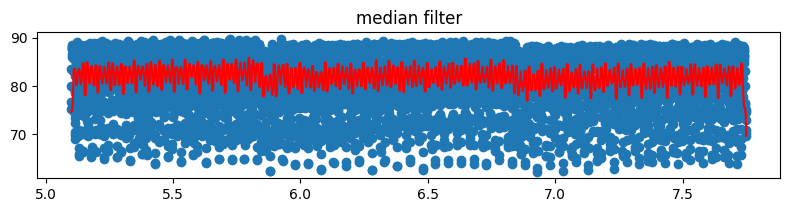

temp550-height-spot_1


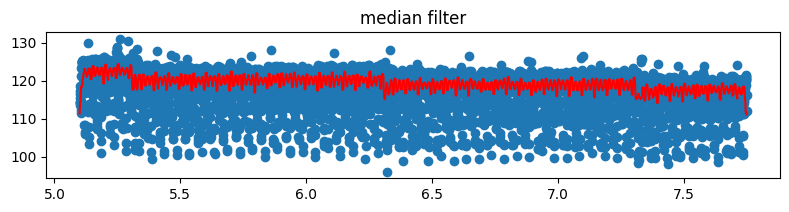

temp550_later_stage-height-spot_1


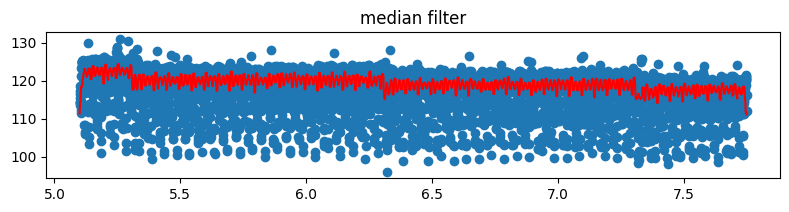

temp600-height-spot_1


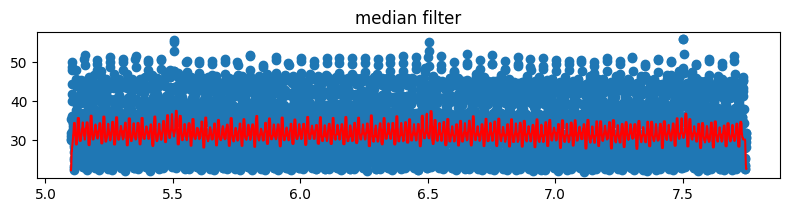

temp600_later_stage-height-spot_1


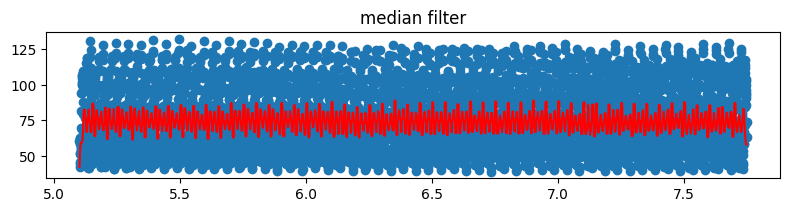

temp500-height-spot_2


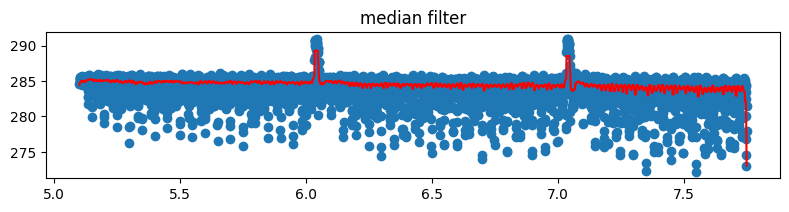

temp500_later_stage-height-spot_2


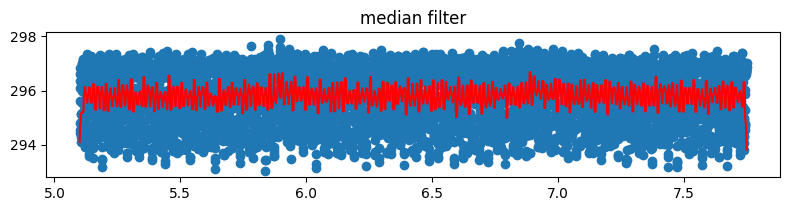

temp550-height-spot_2


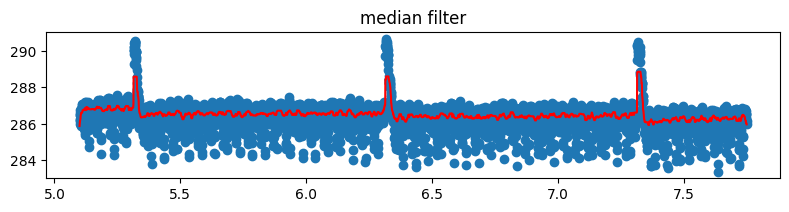

temp550_later_stage-height-spot_2


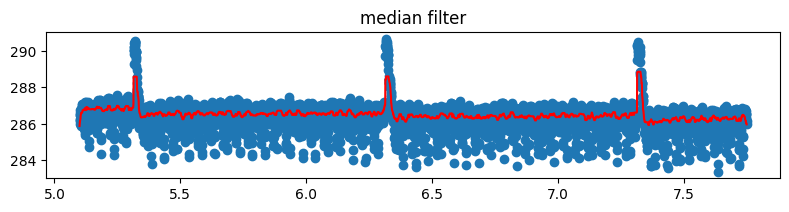

temp600-height-spot_2


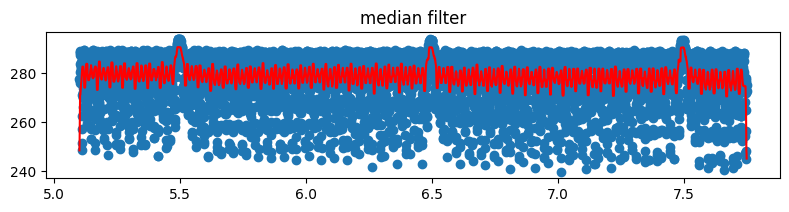

temp600_later_stage-height-spot_2


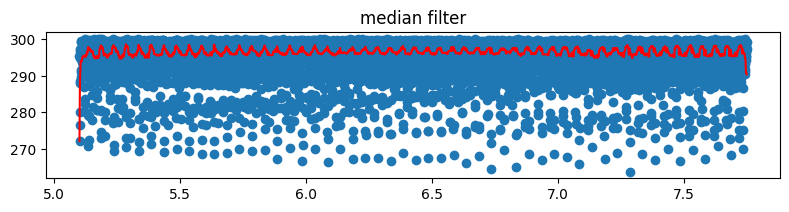

temp500-x-spot_1


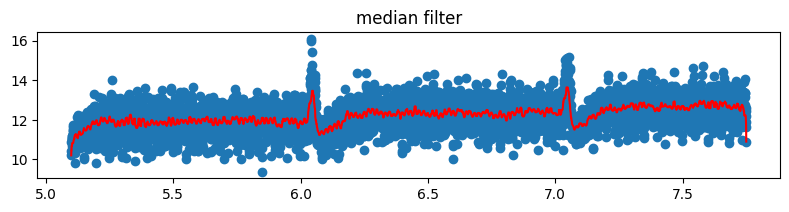

temp500_later_stage-x-spot_1


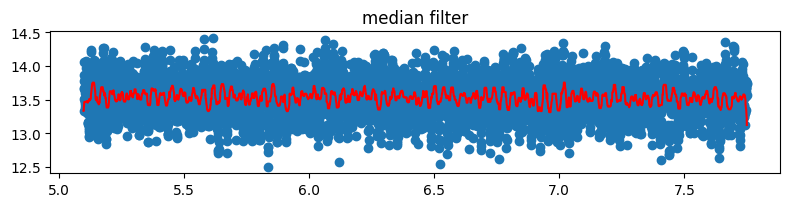

temp550-x-spot_1


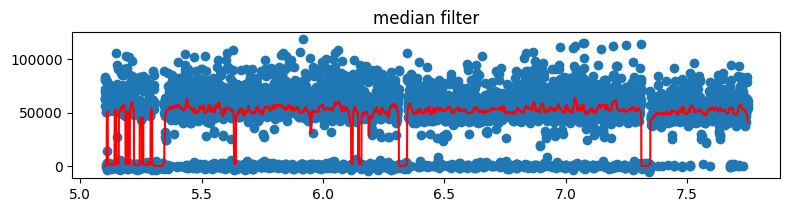

temp550_later_stage-x-spot_1


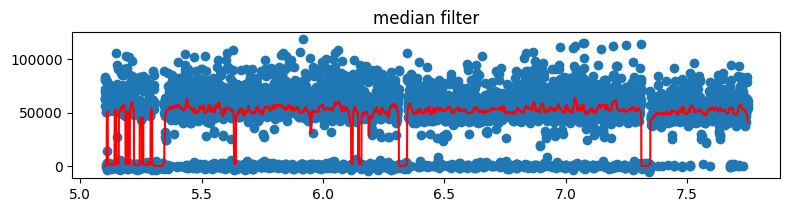

temp600-x-spot_1


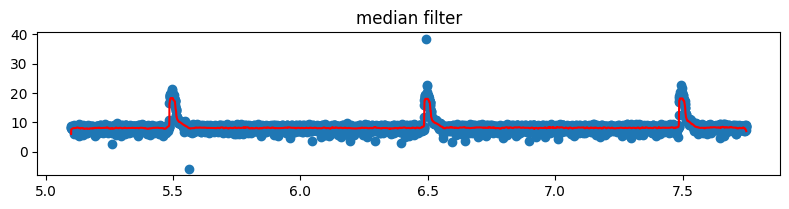

temp600_later_stage-x-spot_1


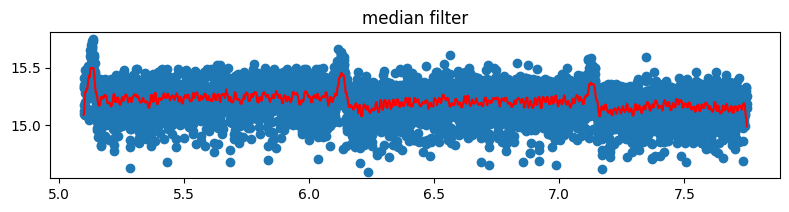

temp500-x-spot_2


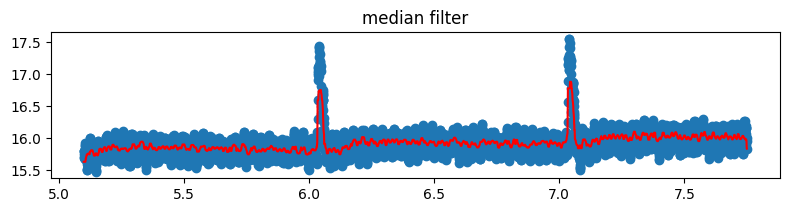

temp500_later_stage-x-spot_2


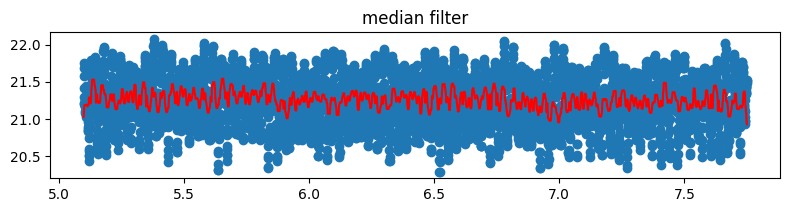

temp550-x-spot_2


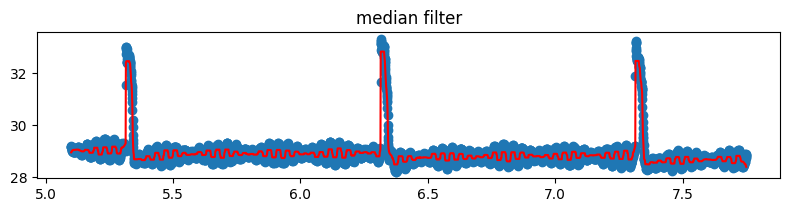

temp550_later_stage-x-spot_2


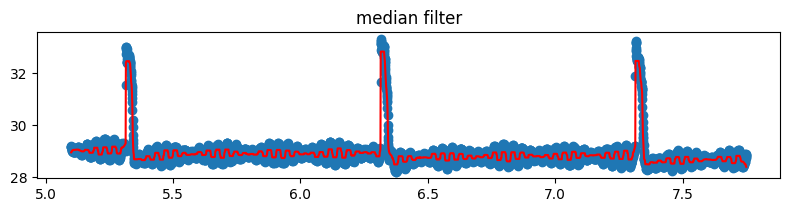

temp600-x-spot_2


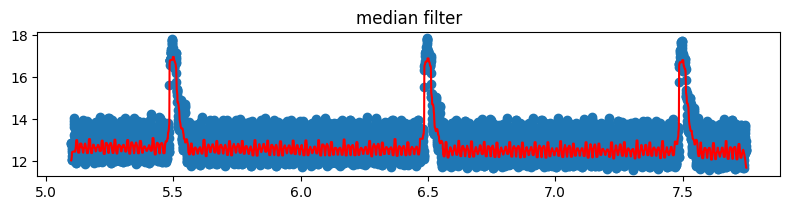

temp600_later_stage-x-spot_2


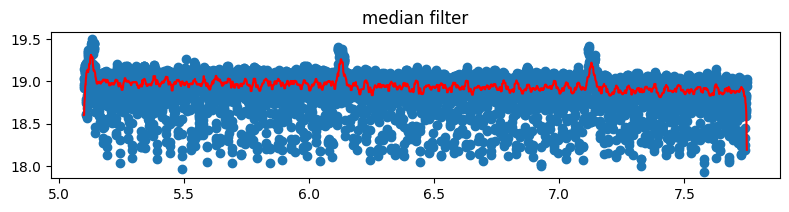

temp500-y-spot_1


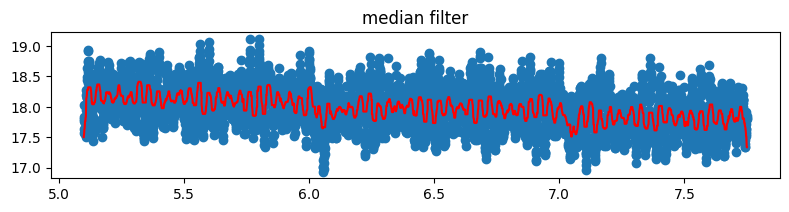

temp500_later_stage-y-spot_1


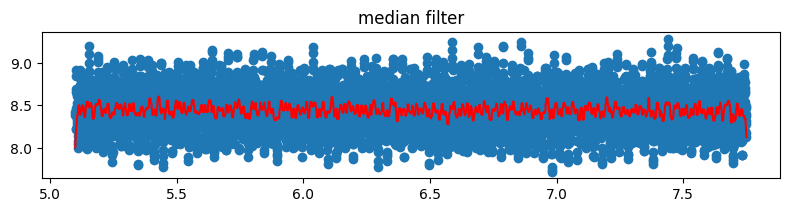

temp550-y-spot_1


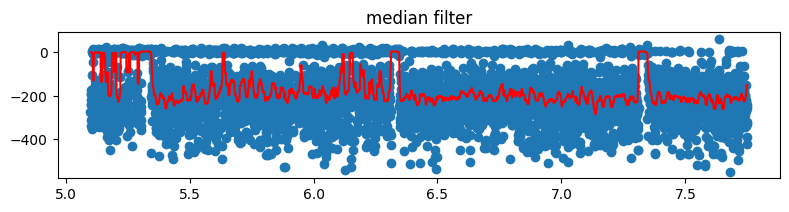

temp550_later_stage-y-spot_1


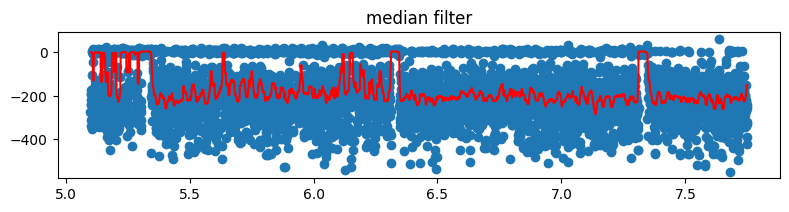

temp600-y-spot_1


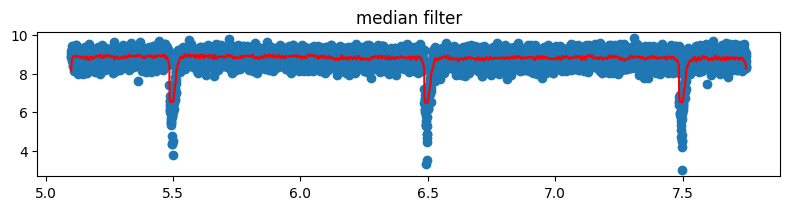

temp600_later_stage-y-spot_1


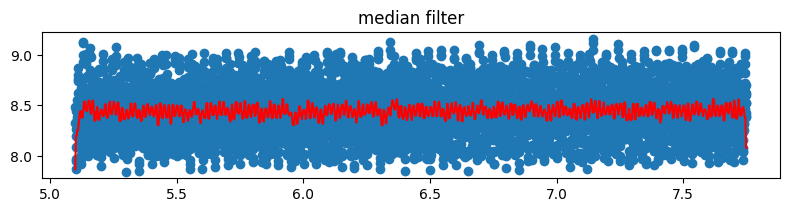

temp500-y-spot_2


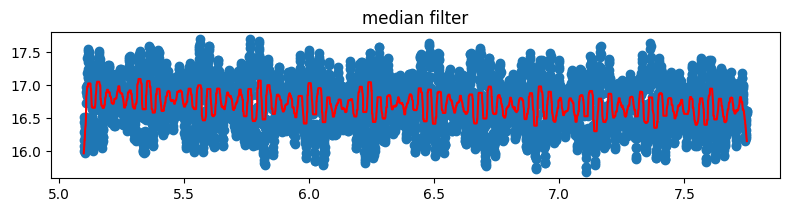

temp500_later_stage-y-spot_2


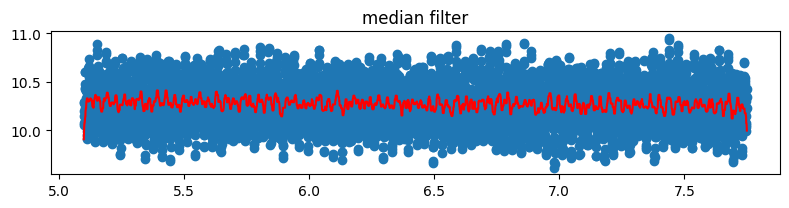

temp550-y-spot_2


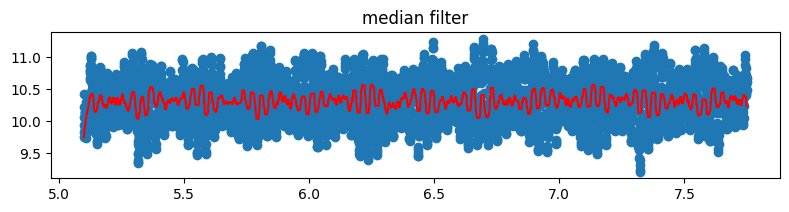

temp550_later_stage-y-spot_2


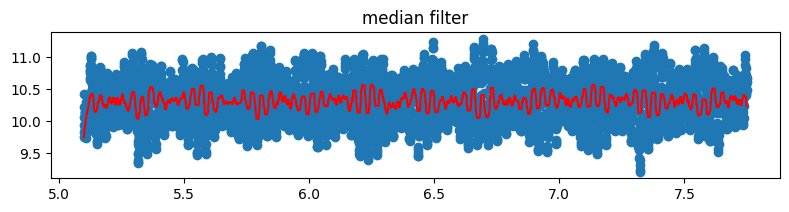

temp600-y-spot_2


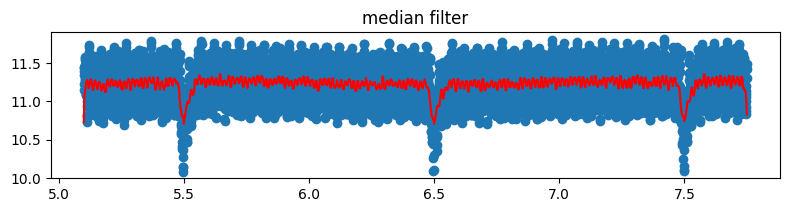

temp600_later_stage-y-spot_2


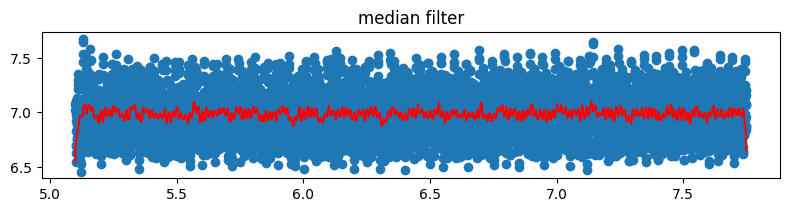

temp500-width_x-spot_1


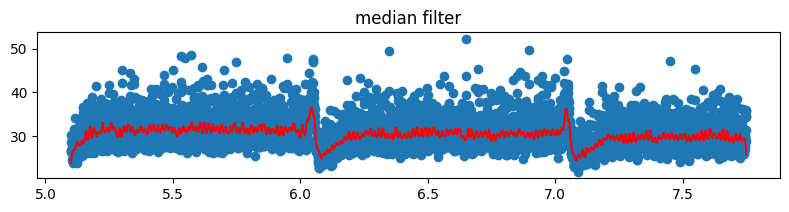

temp500_later_stage-width_x-spot_1


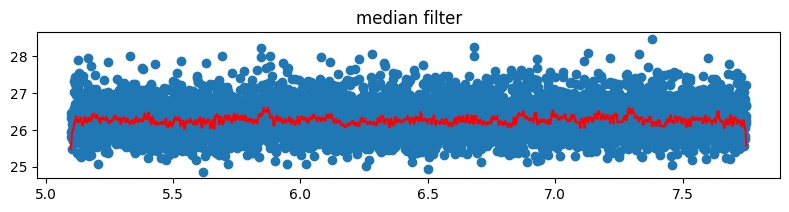

temp550-width_x-spot_1


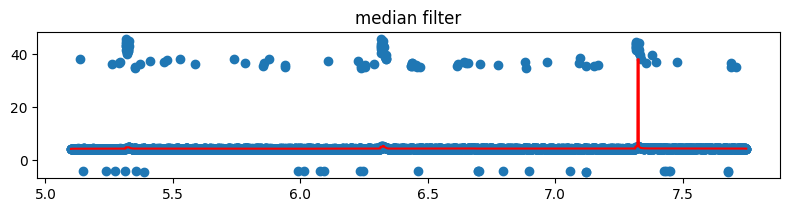

temp550_later_stage-width_x-spot_1


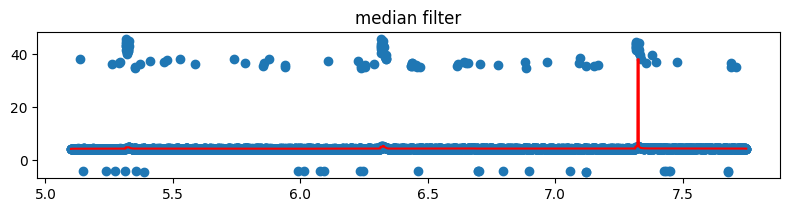

temp600-width_x-spot_1


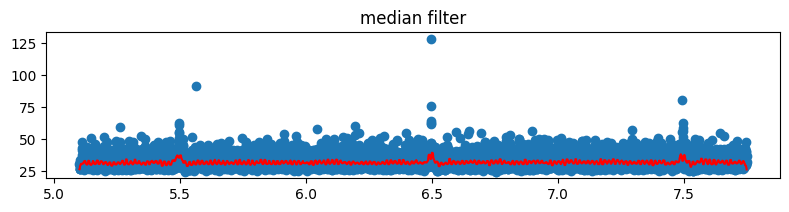

temp600_later_stage-width_x-spot_1


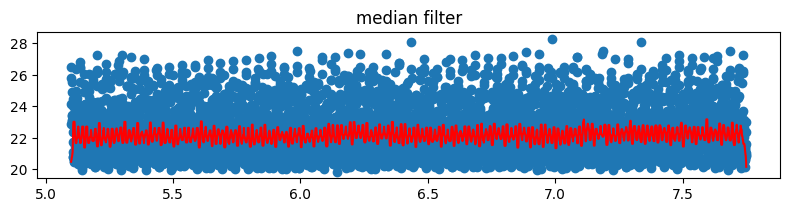

temp500-width_x-spot_2


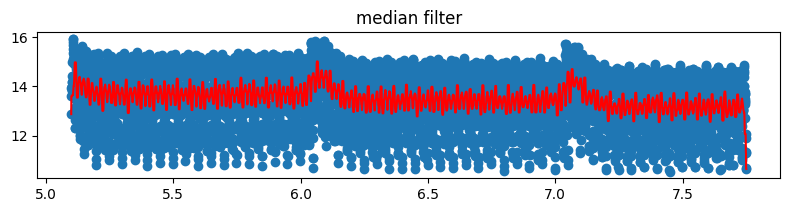

temp500_later_stage-width_x-spot_2


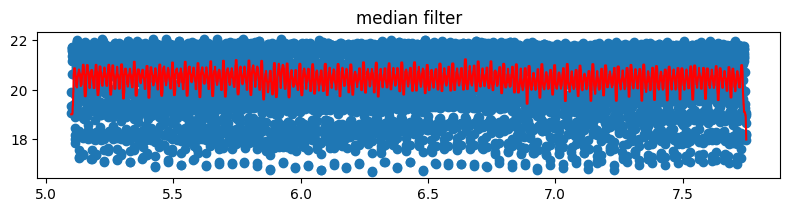

temp550-width_x-spot_2


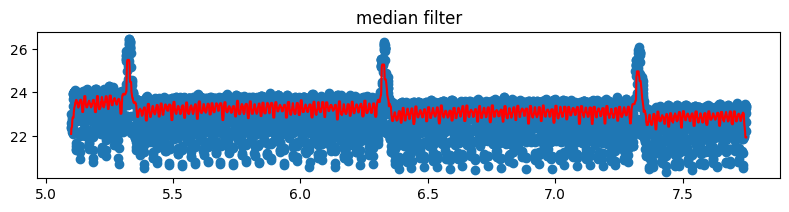

temp550_later_stage-width_x-spot_2


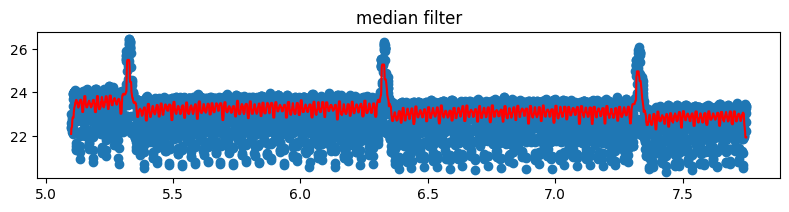

temp600-width_x-spot_2


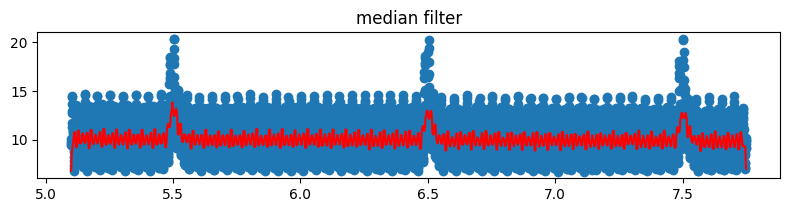

temp600_later_stage-width_x-spot_2


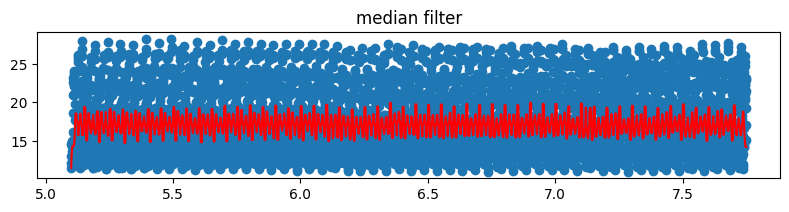

temp500-width_y-spot_1


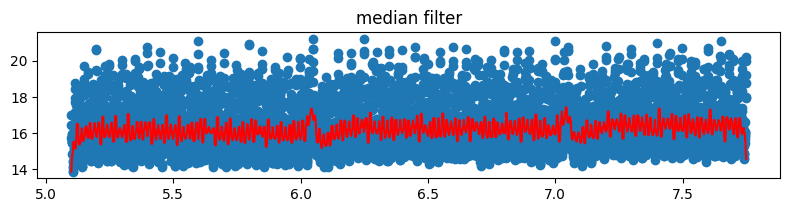

temp500_later_stage-width_y-spot_1


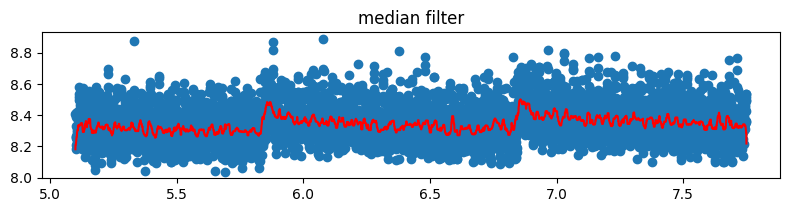

temp550-width_y-spot_1


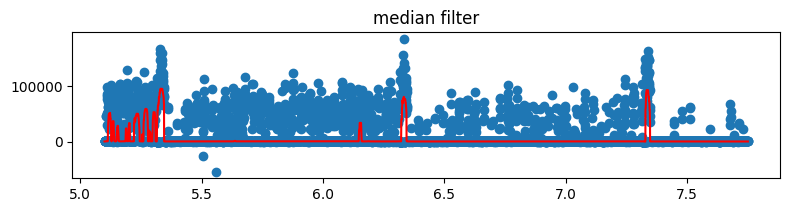

temp550_later_stage-width_y-spot_1


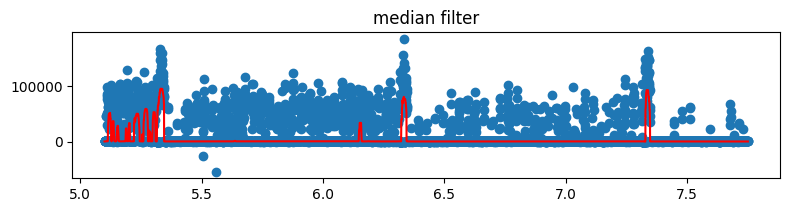

temp600-width_y-spot_1


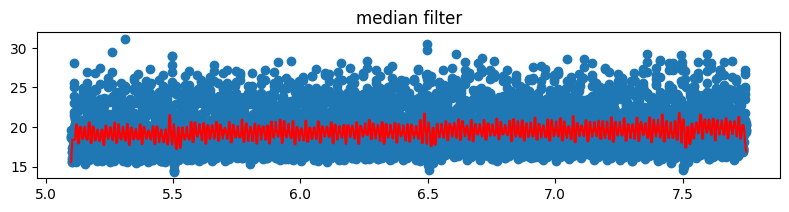

temp600_later_stage-width_y-spot_1


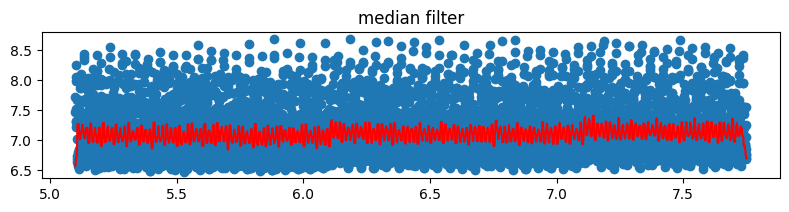

temp500-width_y-spot_2


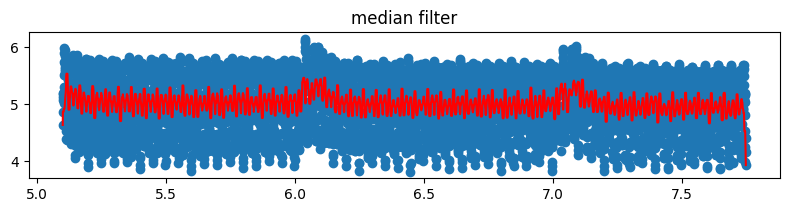

temp500_later_stage-width_y-spot_2


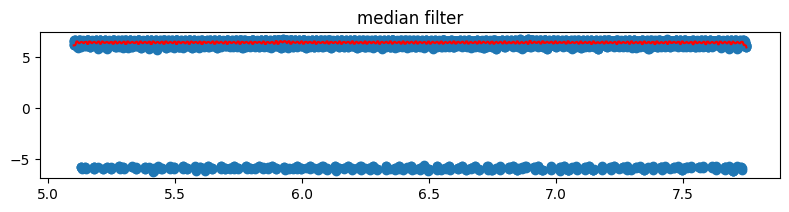

temp550-width_y-spot_2


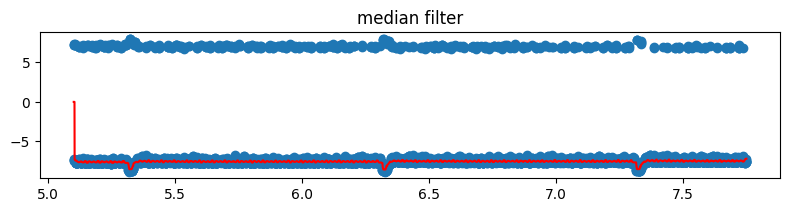

temp550_later_stage-width_y-spot_2


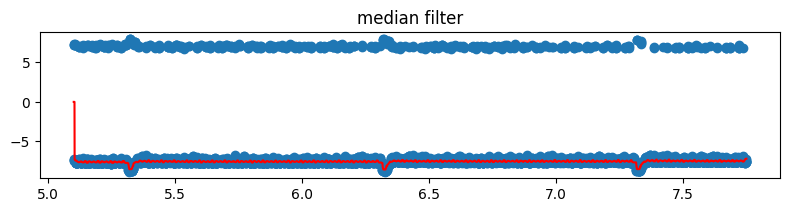

temp600-width_y-spot_2


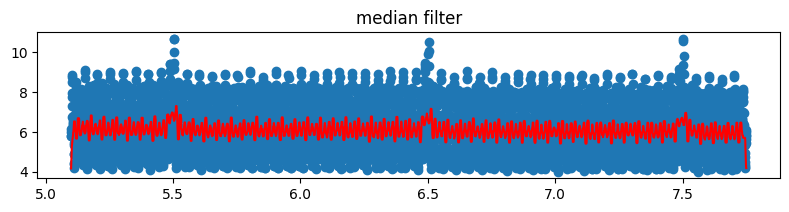

temp600_later_stage-width_y-spot_2


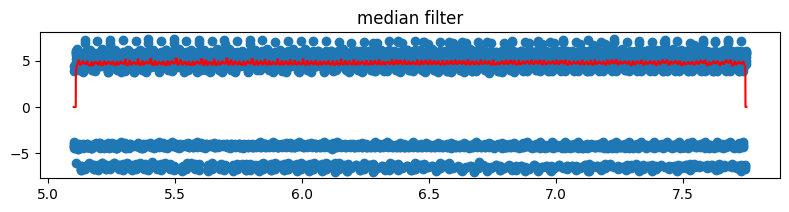

In [6]:
for m in ["height", "x", "y", "width_x", "width_y"]:
    # for m in ["img_sum", "img_rec_sum"]:
    for spot in ['spot_1', 'spot_2']:
        for temp in ds_para.dataset_names[1:]:
                x, y = ds_para.load_curve(growth=temp, spot=spot, metric=m, x_start=0)
                sample_x, sample_y = x[10200:15500], y[10200:15500]
                print(temp + '-' + m + '-' + spot)
                data = np.stack([sample_x, sample_y], 1)

        #         denoised_sample_y = denoise_fft(sample_x, sample_y, cutoff_freq=10, denoise_order=3, sample_frequency=2000)
                sample_x, sample_y = denoise_median(sample_x, sample_y, kernel_size=51, viz=True)

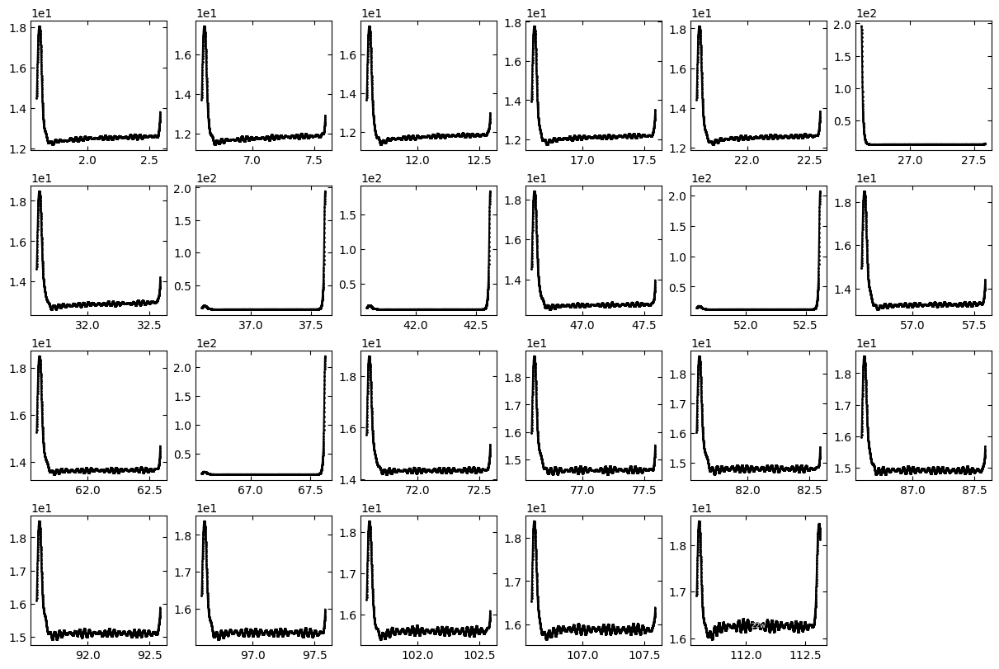

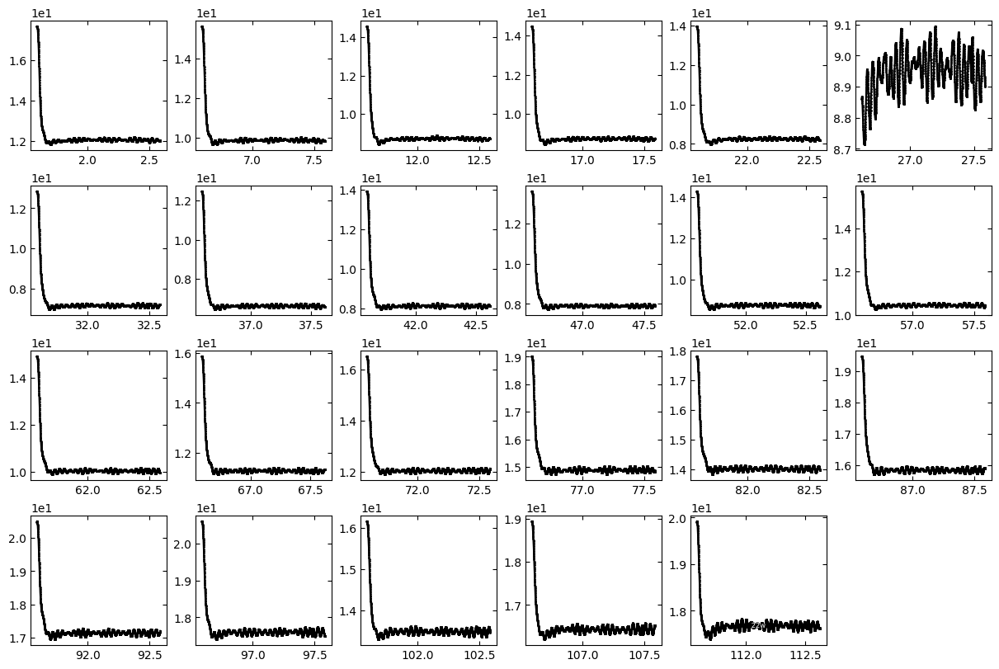

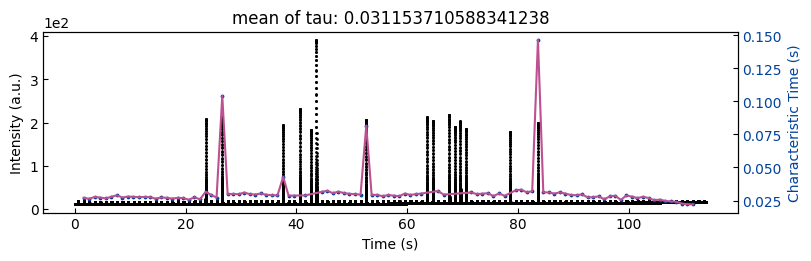

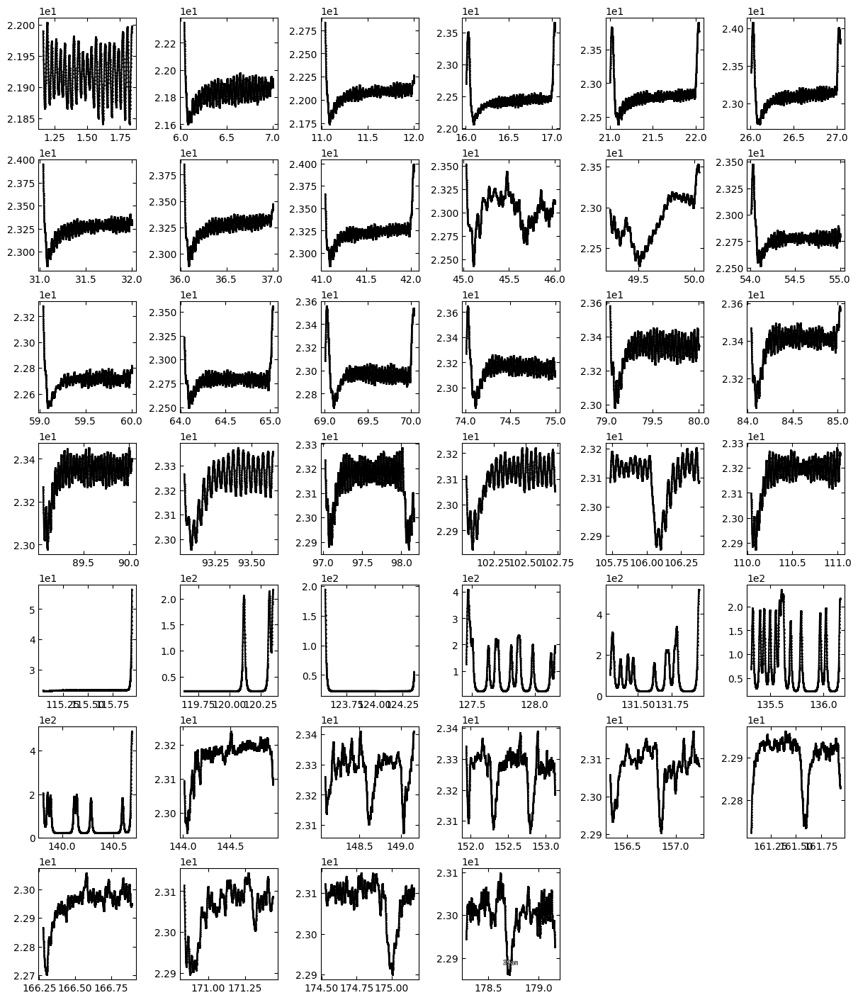

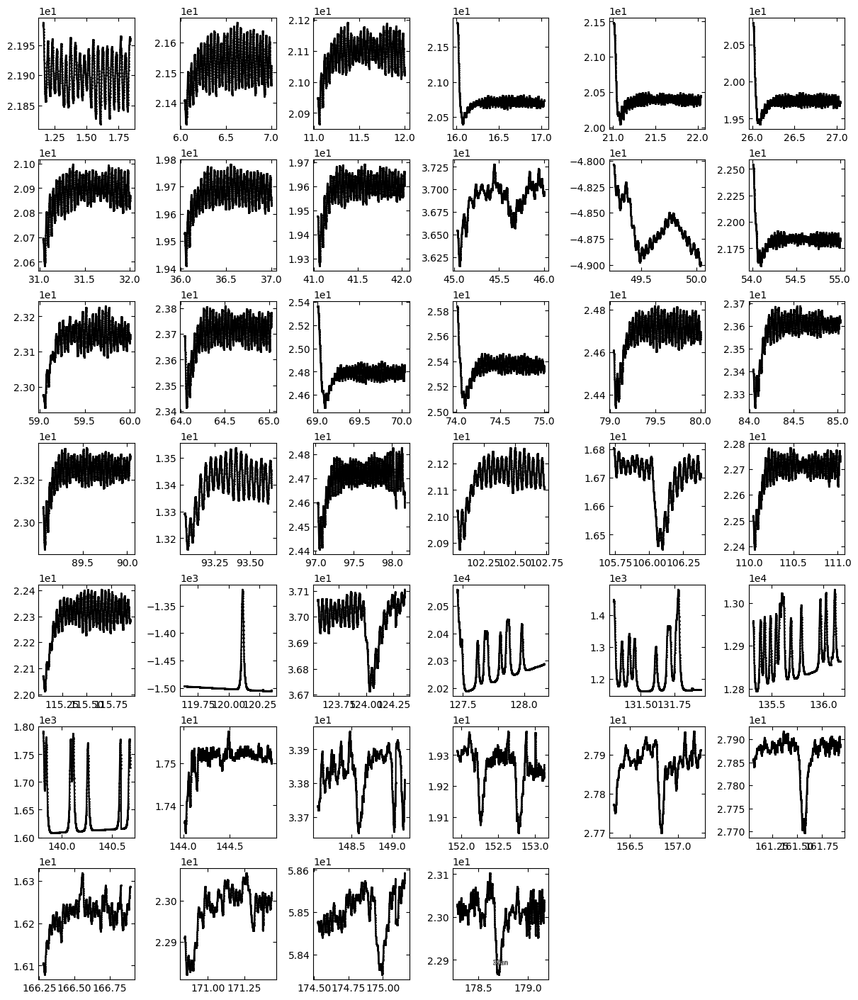

...

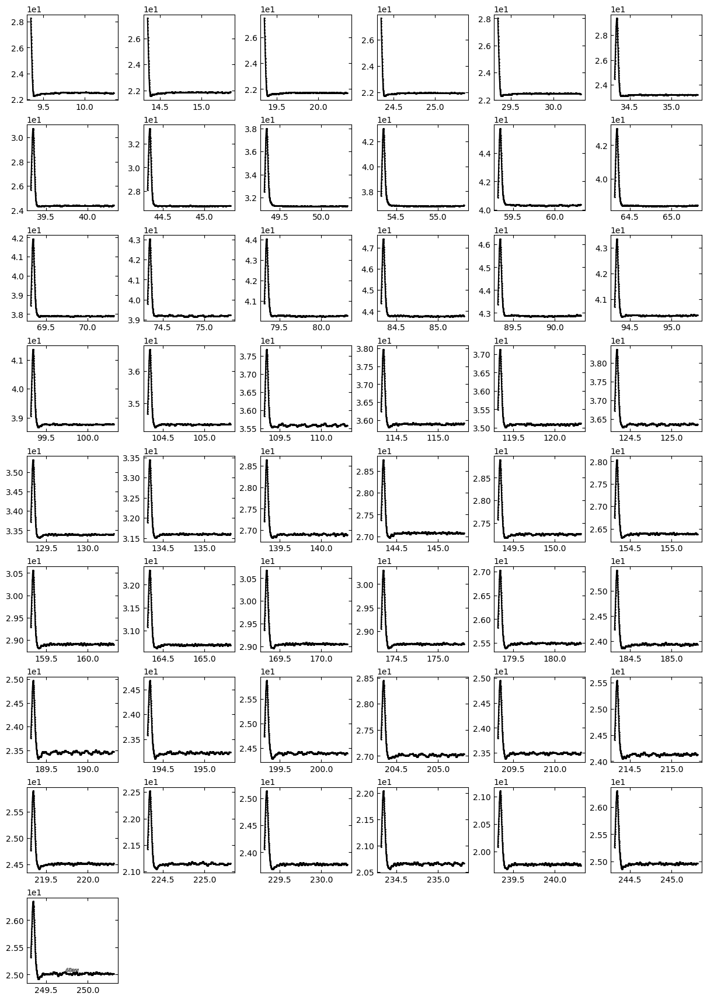

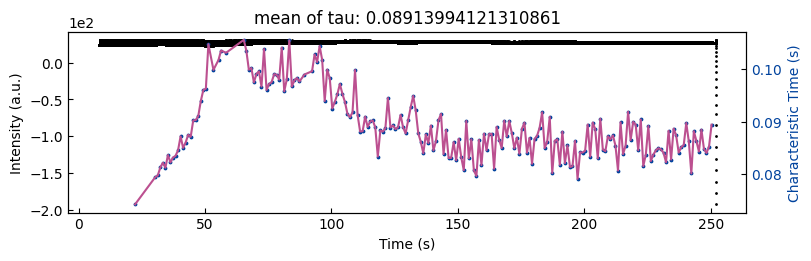

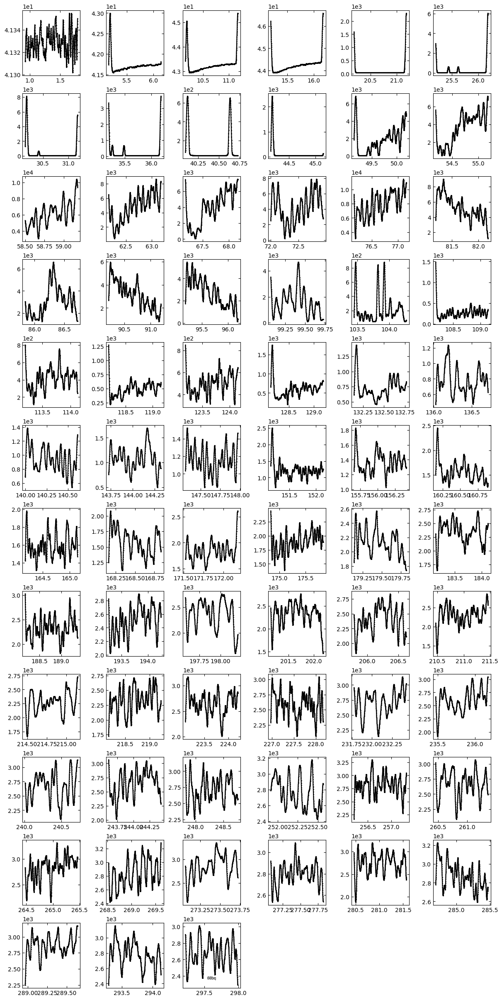

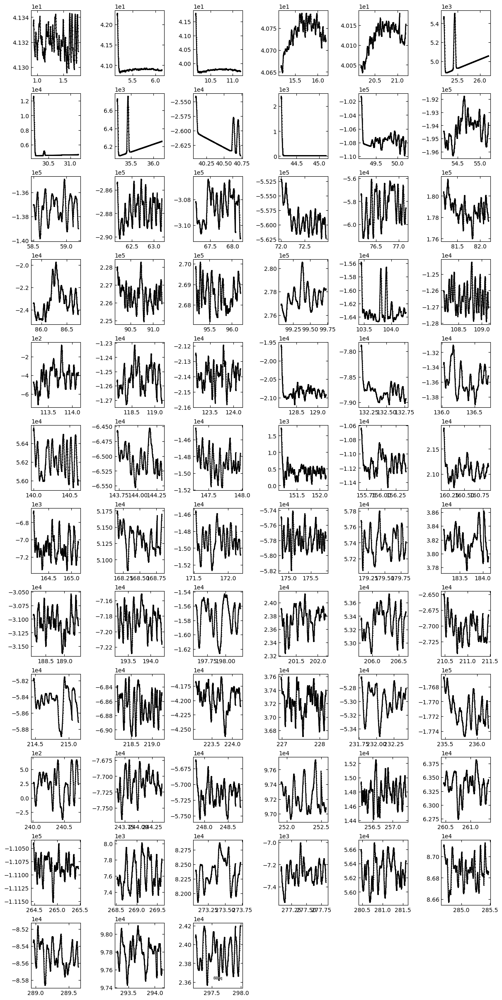

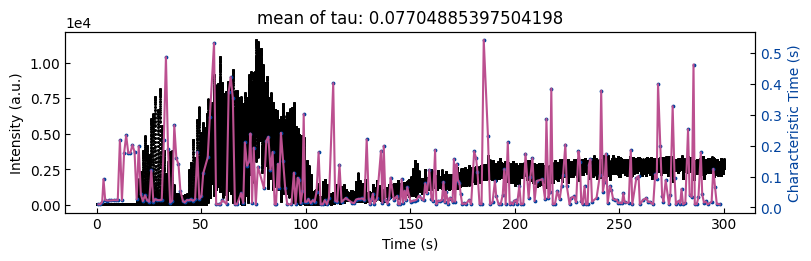

In [13]:
metric = 'x'
viz_params = {'viz_denoise': False, 'viz_raw_curves': False, 'viz_processed_curves':False, 'viz_fittings': False, 'viz_ab': False, 'viz_tau': True, 'per_plot':5}

ys_list = []
tau_list = []
T_list = []
# denoise_params = {'savgol_window_order': (51,3), 'pca_component': 3, 'fft_cutoff_order':(20, 1), 'median_kernel_size':51}
denoise_params = {'savgol_window_order': (51, 3), 'pca_component': None, 'fft_cutoff_order':(5, 1), 'median_kernel_size':51}
curve_params_list = [{'trim_first':'increase_to_decrease', 'tune_tail':True, 'convolve_step':15, 'prominence':0.2, 'mode':'valid', 'linear_ratio':0.8},
                {'trim_first':'increase_to_decrease', 'tune_tail':True, 'convolve_step':15, 'prominence':0.2, 'mode':'valid', 'linear_ratio':0.8},
                {'trim_first':'increase_to_decrease', 'tune_tail':True, 'convolve_step':15, 'prominence':0.2, 'mode':'valid', 'linear_ratio':0.8}]
normalize_params = {'I_diff': None, 'unify':True, 'bounds':[0.01, 1], 'p_init':(1, 0.1, 0.4), 'n_std':1}
# viz_params = {'viz_denoise': False, 'viz_raw_curves': False, 'viz_processed_curves':False, 'viz_fittings': False, 'viz_ab': False, 'viz_tau': False, 'per_plot':5}
    
laser_freq = 1
camera_freq = 2000

ranges_list = [(0, 114), (0, 200), (0, 200)]
temp_list = ['temp250', 'temp300', 'temp350']
T_list += [250, 300, 350]

para_path = '../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5'
ds_para = RHEED_parameter_dataset(para_path, camera_freq=2000, sample_name='J14')
for temp, ranges, curve_params in zip(temp_list, ranges_list, curve_params_list):
    sample_x, sample_y = ds_para.load_curve(growth=temp, spot='spot_2', metric=metric, x_start=0)
    data = np.stack([sample_x, sample_y], 1)
    data = select_range(data, *ranges)

    parameters_all, x_list_all, info, tau = analyze_rheed_data(data, camera_freq, laser_freq, denoise_params, curve_params, normalize_params, viz_params)
    [xs_all, ys_all, ys_fit_all, ys_nor_all, ys_nor_fit_all, ys_nor_fit_failed_all, labels_all, losses_all] = info
    xs, ys = collect_data(ys_nor_all, mean_length=2000, viz=False)
    ys_list.append(ys)
    tau_list.append(tau)


para_path = '../Datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5'
ds_para = RHEED_parameter_dataset(para_path, camera_freq=1000, sample_name='J14')

denoise_params = {'savgol_window_order': (51, 3), 'pca_component': None, 'fft_cutoff_order':(5, 1), 'median_kernel_size':51}
curve_params_list = [{'trim_first':'increase_to_decrease', 'tune_tail':True, 'convolve_step':15, 'prominence':0.2, 'mode':'valid', 'linear_ratio':0.8},
                    {'trim_first':'decrease_to_increase', 'tune_tail':True, 'convolve_step':15, 'prominence':0.2, 'mode':'valid', 'linear_ratio':0.8}]
normalize_params = {'I_diff': None, 'unify':True, 'bounds':[0.01, 2], 'p_init':(1, 0.1, 0.1), 'n_std':1}
# viz_params = {'viz_denoise': False, 'viz_raw_curves': False, 'viz_processed_curves':False, 'viz_fittings': False, 'viz_ab': False, 'viz_tau': False, 'per_plot':5}
laser_freq = 1
camera_freq = 2000
ranges_list = [(0, 140), (0, 150)]
temp_list = ['temp500', 'temp550']
T_list += [500, 550]

for temp, ranges, curve_params in zip(temp_list, ranges_list, curve_params_list):
    sample_x, sample_y = ds_para.load_curve(growth=temp, spot='spot_2', metric=metric, x_start=0)
    data = np.stack([sample_x, sample_y], 1)
    data = select_range(data, *ranges)
    parameters_all, x_list_all, info, tau = analyze_rheed_data(data, camera_freq, laser_freq, denoise_params, curve_params, normalize_params, viz_params)
    [xs_all, ys_all, ys_fit_all, ys_nor_all, ys_nor_fit_all, ys_nor_fit_failed_all, labels_all, losses_all] = info
    xs, ys = collect_data(ys_nor_all, mean_length=1000, viz=False)
    ys_list.append(ys)
    tau_list.append(tau)


para_path = '../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5'
ds_para = RHEED_parameter_dataset(para_path, camera_freq=1000, sample_name='J14')
denoise_params = {'savgol_window_order': (51, 3), 'pca_component': None, 'fft_cutoff_order':(5, 1), 'median_kernel_size':51}
curve_params_list = [{'trim_first':'increase_to_decrease', 'tune_tail':True, 'convolve_step':15, 'prominence':0.2, 'mode':'valid', 'linear_ratio':0.8},
                    {'trim_first':'increase_to_decrease', 'tune_tail':True, 'convolve_step':15, 'prominence':0.2, 'mode':'valid', 'linear_ratio':0.8},
                    {'trim_first':0, 'tune_tail':True, 'convolve_step':15, 'prominence':0.2, 'mode':'valid', 'linear_ratio':0.8},
                    {'trim_first':'increase_to_decrease', 'tune_tail':True, 'convolve_step':15, 'prominence':0.2, 'mode':'valid', 'linear_ratio':0.8}]
normalize_params = {'I_diff': None, 'unify':True, 'bounds':[0.01, 2], 'p_init':(1, 0.1, 0.1), 'n_std':1}
# viz_params = {'viz_denoise': True, 'viz_raw_curves': False, 'viz_processed_curves':False, 'viz_fittings': False, 'viz_ab': False, 'viz_tau': False, 'per_plot':5}
laser_freq = 1
camera_freq = 1000
ranges_list = [(40, 300), (52, 250), (8, 300), (0, 300)]
temp_list = ['temp350', 'temp400', 'temp450', 'temp800']
T_list += [350, 400, 450, 800]

for temp, ranges, curve_params in zip(temp_list, ranges_list, curve_params_list):
    sample_x, sample_y = ds_para.load_curve(growth=temp, spot='spot_2', metric=metric, x_start=0)
    data = np.stack([sample_x, sample_y], 1)
    data = select_range(data, *ranges)
    parameters_all, x_list_all, info, tau = analyze_rheed_data(data, camera_freq, laser_freq, denoise_params, curve_params, normalize_params, viz_params)
    [xs_all, ys_all, ys_fit_all, ys_nor_all, ys_nor_fit_all, ys_nor_fit_failed_all, labels_all, losses_all] = info
    xs, ys = collect_data(ys_nor_all, mean_length=2000, viz=False)
    ys_list.append(ys)
    tau_list.append(tau)

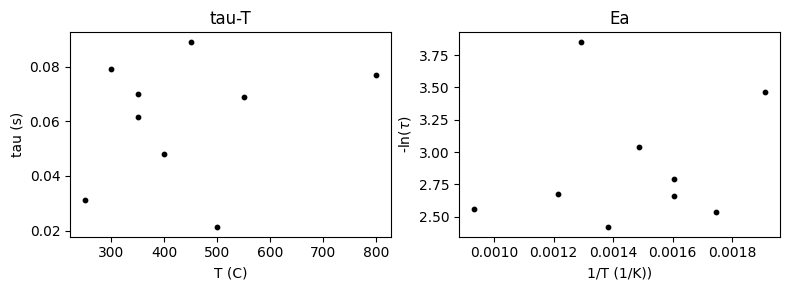

In [16]:
tau_mean_list = np.array([np.mean(tau) for tau in tau_list])
fig, axes = plt.subplots(1, 2, figsize=(8,3))

axes[0].scatter(T_list, tau_mean_list, color='k', s=10)
axes[0].set_xlabel('T (C)')
axes[0].set_ylabel('tau (s)')
# axes[0].set_ylim(0,0.2)
axes[0].set_title('tau-T')


T = np.array(T_list) + 273
x = 1/(T)
y = -np.log(tau_mean_list)
m, b = np.polyfit(x, y, 1)

axes[1].scatter(x, y, color='k', s=10)
axes[1].set_xlabel('1/T (1/K))')
axes[1].set_ylabel(r'-ln($\tau$)')
axes[1].set_title('Ea')
plt.tight_layout()
plt.show()

### metrix: x

../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5 temp250


c:\Users\yig319\Anaconda3\envs\m3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<__array_function__ internals>:180: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
../../../src\m3_learning\RHEED\Analysis_umich.py:59: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ys_nor_all = np.array(ys_nor_all)
../../../src\m3_learning\RHEED\Analysis_umich.py:60: VisibleDeprecationWarning: Creating an ndarray from ragged nest

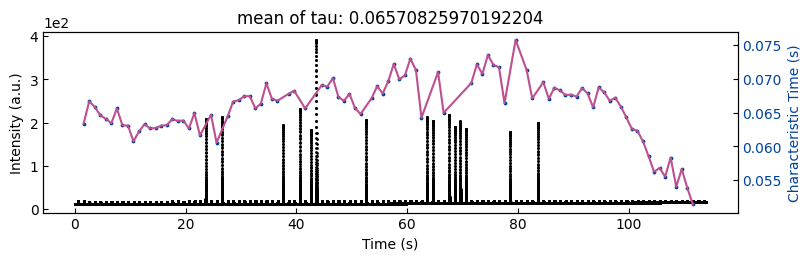

../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5 temp300


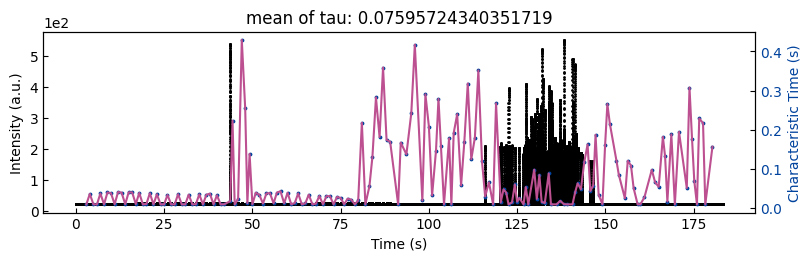

../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5 temp350


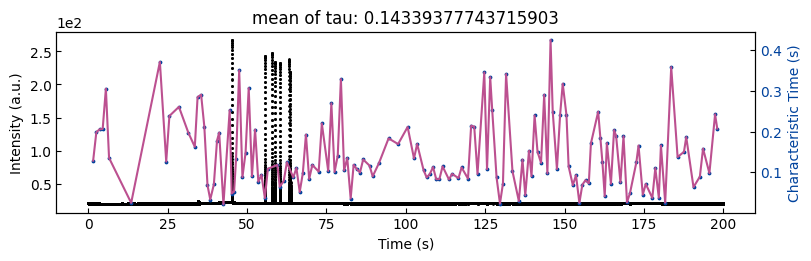

../Datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5 temp500


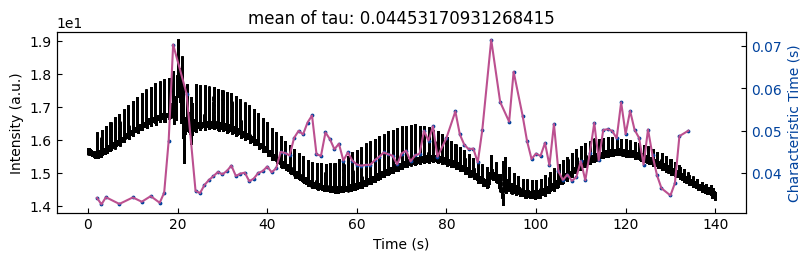

../Datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5 temp550


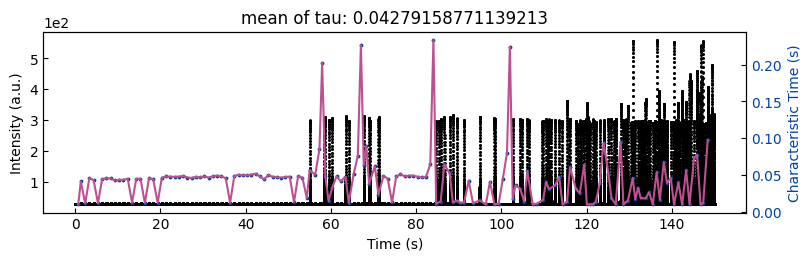

../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5 temp350


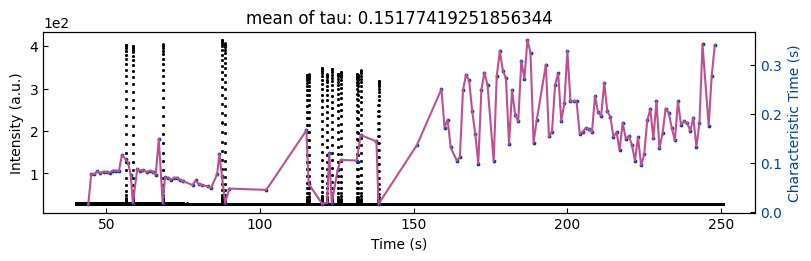

../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5 temp400


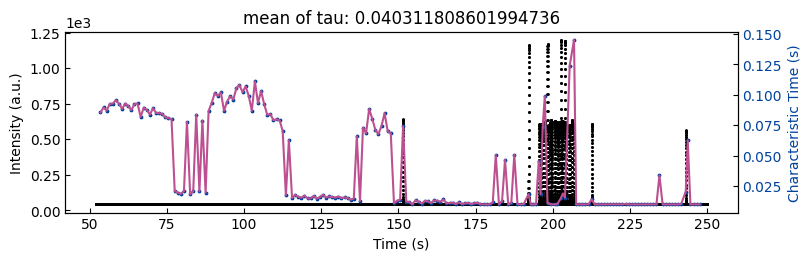

../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5 temp450


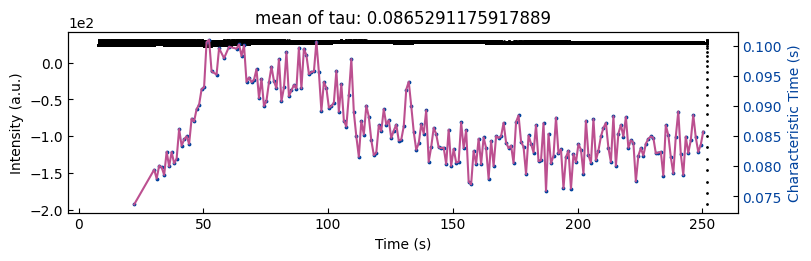

../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5 temp800


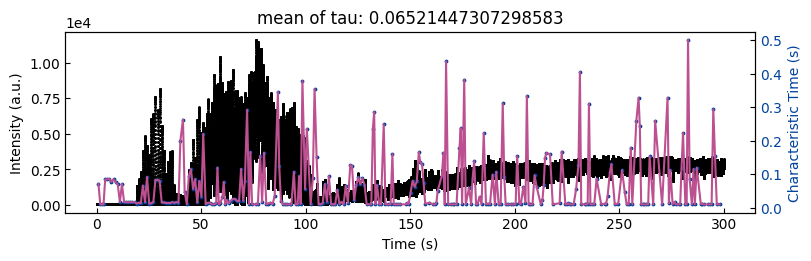

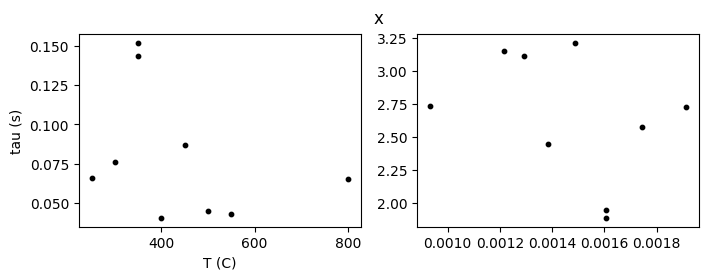

In [36]:
metric = 'x'
spot = 'spot_2'
viz_params = {'viz_denoise': False, 'viz_raw_curves': False, 'viz_processed_curves':False, 'viz_fittings': False, 'viz_ab': False, 'viz_tau': True, 'per_plot':5}

ys_list, tau_list  = [], []
laser_freq = 1
camera_freq_list = [2000, 2000, 2000, 2000, 2000, 1000, 1000, 1000, 1000]
ranges_list = [(0, 114), (0, 200), (0, 200), (0, 140), (0, 150), (40, 300), (52, 250), (8, 300), (0, 300)]
temp_list = ['temp250', 'temp300', 'temp350', 'temp500', 'temp550', 'temp350', 'temp400', 'temp450', 'temp800']
T_list = [250, 300, 350, 500, 550, 350, 400, 450, 800]
# denoise_params = {'savgol_window_order': (51,3), 'pca_component': 3, 'fft_cutoff_order':(20, 1), 'median_kernel_size':51}
denoise_params = {'savgol_window_order': (51, 3), 'pca_component': None, 'fft_cutoff_order':(5, 1), 'median_kernel_size':51}
normalize_params = {'I_diff': None, 'unify':True, 'bounds':[0.01, 1], 'p_init':(1, 0.1, 0.4), 'n_std':1}

para_path_list= ['../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5',
                 '../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5',
                 '../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5',
                 '../Datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5',
                 '../Datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5',
                 '../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5',
                 '../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5',
                 '../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5',
                 '../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5']
curve_params = {'trim_first':0, 'tune_tail':True, 'convolve_step':15, 'prominence':0.2, 'mode':'valid', 'linear_ratio':0.8}
    

for temp, ranges, para_path, camera_freq in zip(temp_list, ranges_list, para_path_list, camera_freq_list):
    ds_para = RHEED_parameter_dataset(para_path, camera_freq=camera_freq, sample_name='J14')

    print(para_path, temp)
    sample_x, sample_y = ds_para.load_curve(growth=temp, spot=spot, metric=metric, x_start=0)
    data = np.stack([sample_x, sample_y], 1)
    data = select_range(data, *ranges)

    parameters_all, x_list_all, info, tau = analyze_rheed_data(data, camera_freq, laser_freq, denoise_params, curve_params, normalize_params, viz_params)
    [xs_all, ys_all, ys_fit_all, ys_nor_all, ys_nor_fit_all, ys_nor_fit_failed_all, labels_all, losses_all] = info
    xs, ys = collect_data(ys_nor_all, mean_length=2000, viz=False)
    ys_list.append(ys)
    tau_list.append(tau)

tau_mean_list = np.array([np.mean(tau) for tau in tau_list])
plot_activation_energy(T_list, tau_mean_list, fit=False, title=metric, save_path=f'../Saved_data/{metric}.png')

### metrix: y

../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5 temp250


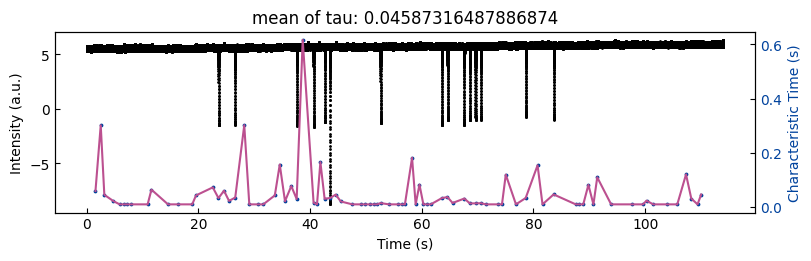

../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5 temp300


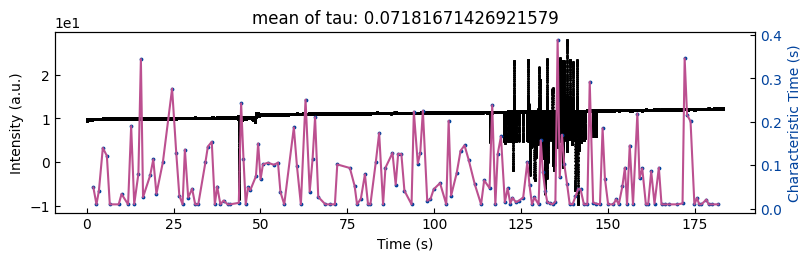

../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5 temp350


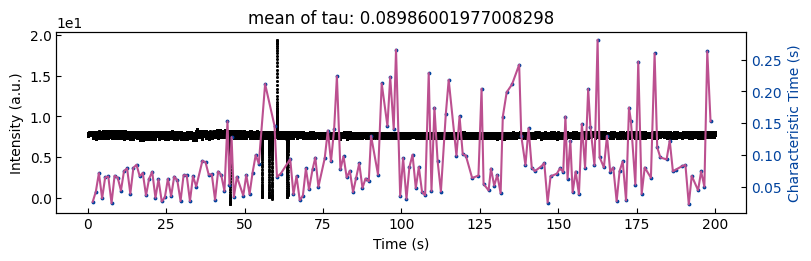

../Datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5 temp500


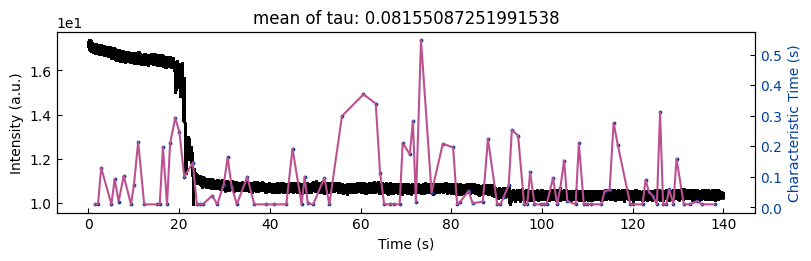

../Datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5 temp550


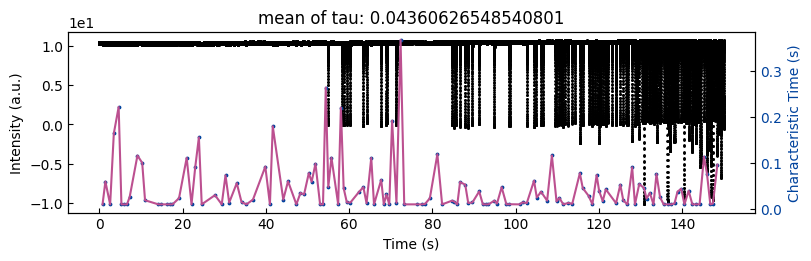

../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5 temp350


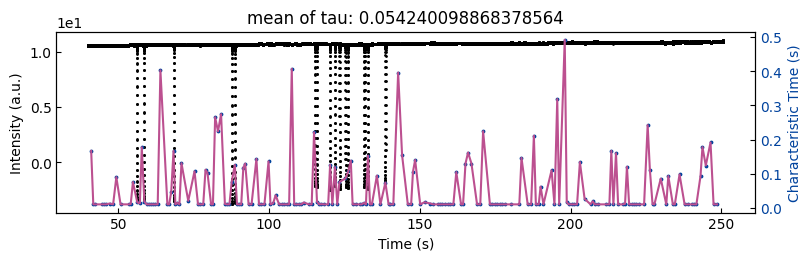

../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5 temp400


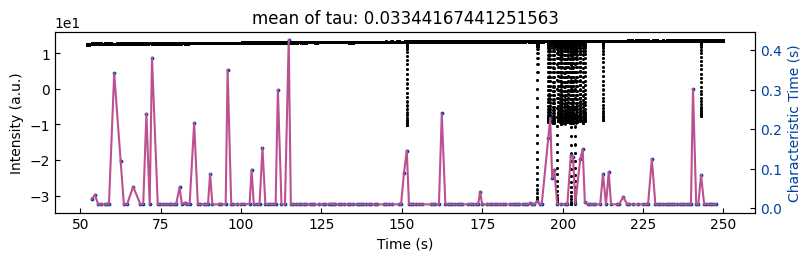

../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5 temp450


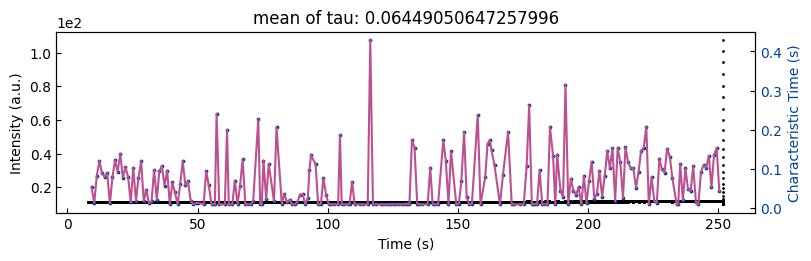

../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5 temp800


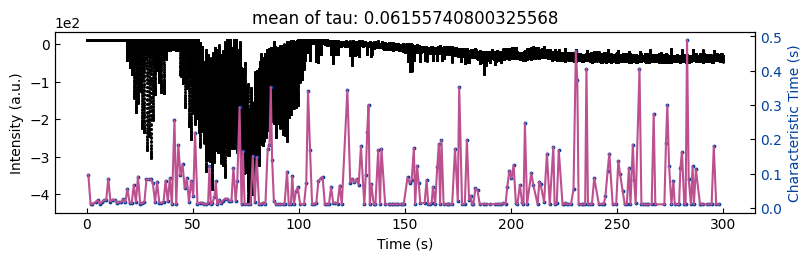

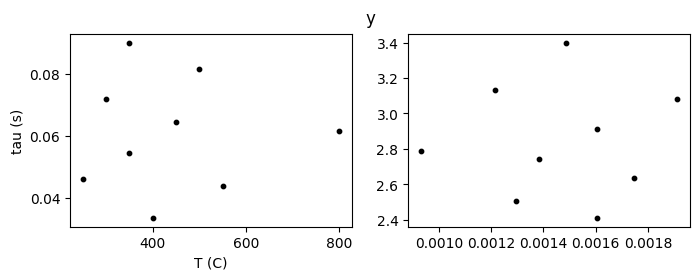

In [37]:
metric = 'y'
spot = 'spot_2'
viz_params = {'viz_denoise': False, 'viz_raw_curves': False, 'viz_processed_curves':False, 'viz_fittings': False, 'viz_ab': False, 'viz_tau': True, 'per_plot':5}

ys_list, tau_list  = [], []
laser_freq = 1
camera_freq_list = [2000, 2000, 2000, 2000, 2000, 1000, 1000, 1000, 1000]
ranges_list = [(0, 114), (0, 200), (0, 200), (0, 140), (0, 150), (40, 300), (52, 250), (8, 300), (0, 300)]
temp_list = ['temp250', 'temp300', 'temp350', 'temp500', 'temp550', 'temp350', 'temp400', 'temp450', 'temp800']
T_list = [250, 300, 350, 500, 550, 350, 400, 450, 800]
# denoise_params = {'savgol_window_order': (51,3), 'pca_component': 3, 'fft_cutoff_order':(20, 1), 'median_kernel_size':51}
denoise_params = {'savgol_window_order': (51, 3), 'pca_component': None, 'fft_cutoff_order':(5, 1), 'median_kernel_size':51}
normalize_params = {'I_diff': None, 'unify':True, 'bounds':[0.01, 1], 'p_init':(1, 0.1, 0.4), 'n_std':1}

para_path_list= ['../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5',
                 '../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5',
                 '../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5',
                 '../Datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5',
                 '../Datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5',
                 '../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5',
                 '../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5',
                 '../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5',
                 '../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5']
curve_params = {'trim_first':0, 'tune_tail':True, 'convolve_step':15, 'prominence':0.2, 'mode':'valid', 'linear_ratio':0.8}
    

for temp, ranges, para_path, camera_freq in zip(temp_list, ranges_list, para_path_list, camera_freq_list):
    ds_para = RHEED_parameter_dataset(para_path, camera_freq=camera_freq, sample_name='J14')

    print(para_path, temp)
    sample_x, sample_y = ds_para.load_curve(growth=temp, spot=spot, metric=metric, x_start=0)
    data = np.stack([sample_x, sample_y], 1)
    data = select_range(data, *ranges)

    parameters_all, x_list_all, info, tau = analyze_rheed_data(data, camera_freq, laser_freq, denoise_params, curve_params, normalize_params, viz_params)
    [xs_all, ys_all, ys_fit_all, ys_nor_all, ys_nor_fit_all, ys_nor_fit_failed_all, labels_all, losses_all] = info
    xs, ys = collect_data(ys_nor_all, mean_length=2000, viz=False)
    ys_list.append(ys)
    tau_list.append(tau)

tau_mean_list = np.array([np.mean(tau) for tau in tau_list])
plot_activation_energy(T_list, tau_mean_list, fit=False, title=metric, save_path=f'../Saved_data/{metric}.png')

### metric: height

../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5 temp250


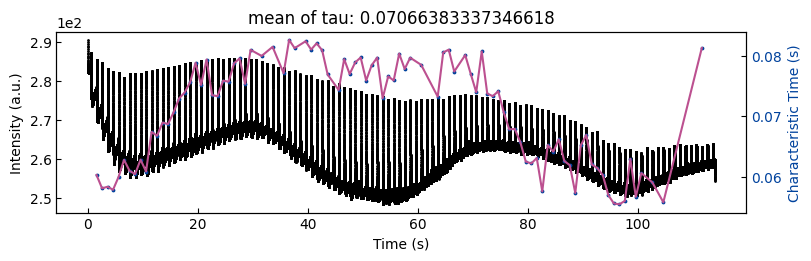

../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5 temp300


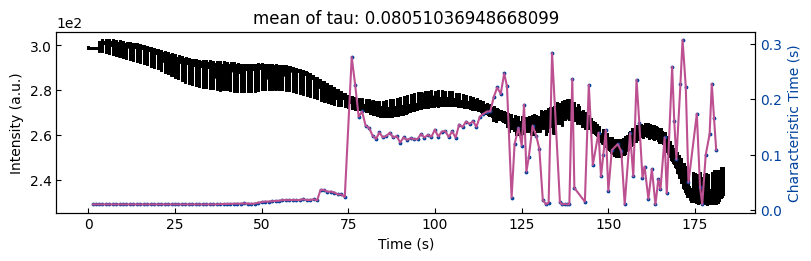

../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5 temp350


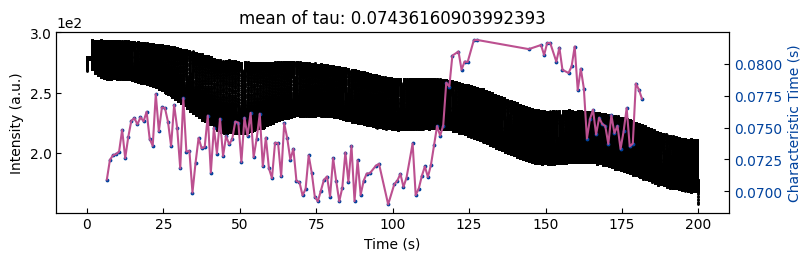

../Datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5 temp500


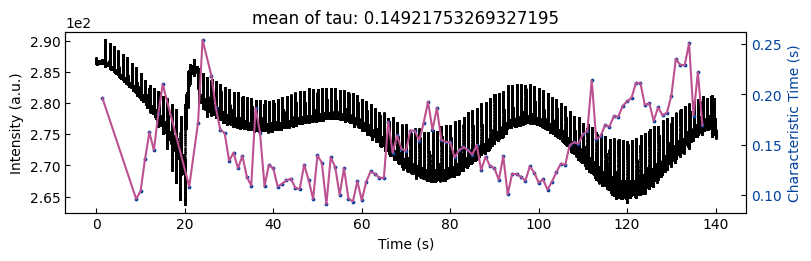

../Datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5 temp550


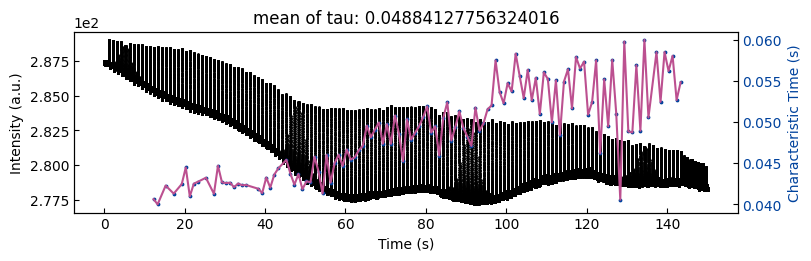

../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5 temp350


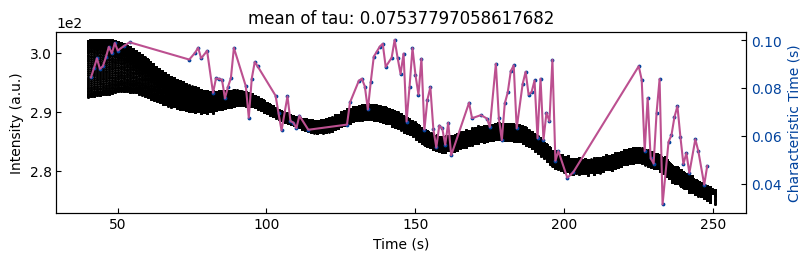

../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5 temp400


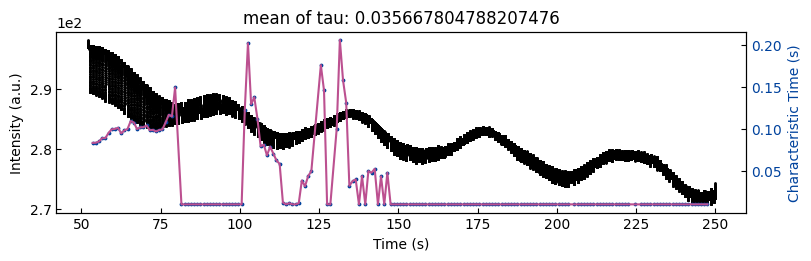

../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5 temp450


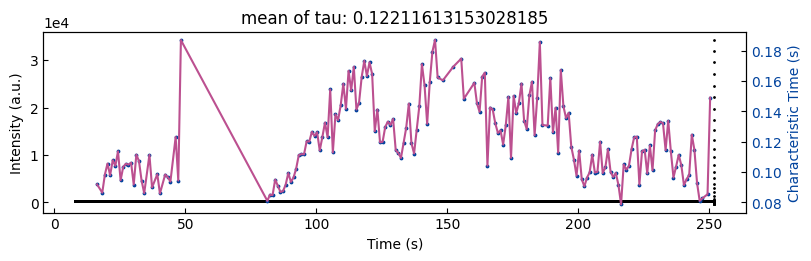

../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5 temp800


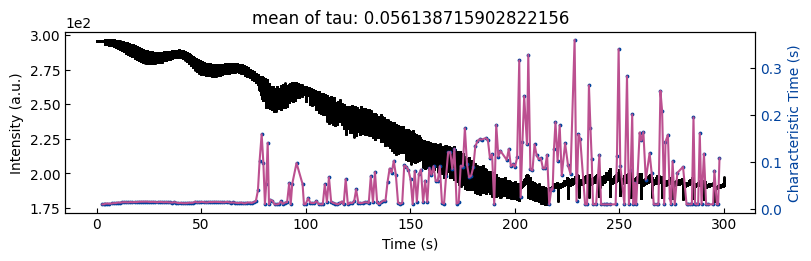

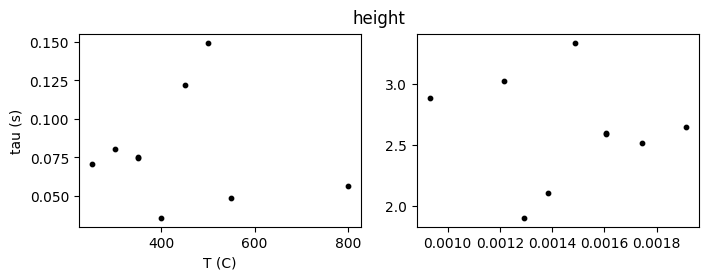

In [38]:
metric = 'height'
spot = 'spot_2'
viz_params = {'viz_denoise': False, 'viz_raw_curves': False, 'viz_processed_curves':False, 'viz_fittings': False, 'viz_ab': False, 'viz_tau': True, 'per_plot':5}

ys_list, tau_list  = [], []
laser_freq = 1
camera_freq_list = [2000, 2000, 2000, 2000, 2000, 1000, 1000, 1000, 1000]
ranges_list = [(0, 114), (0, 200), (0, 200), (0, 140), (0, 150), (40, 300), (52, 250), (8, 300), (0, 300)]
temp_list = ['temp250', 'temp300', 'temp350', 'temp500', 'temp550', 'temp350', 'temp400', 'temp450', 'temp800']
T_list = [250, 300, 350, 500, 550, 350, 400, 450, 800]
# denoise_params = {'savgol_window_order': (51,3), 'pca_component': 3, 'fft_cutoff_order':(20, 1), 'median_kernel_size':51}
denoise_params = {'savgol_window_order': (51, 3), 'pca_component': None, 'fft_cutoff_order':(5, 1), 'median_kernel_size':51}
normalize_params = {'I_diff': None, 'unify':True, 'bounds':[0.01, 1], 'p_init':(1, 0.1, 0.4), 'n_std':1}

para_path_list= ['../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5',
                 '../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5',
                 '../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5',
                 '../Datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5',
                 '../Datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5',
                 '../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5',
                 '../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5',
                 '../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5',
                 '../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5']
curve_params = {'trim_first':0, 'tune_tail':True, 'convolve_step':15, 'prominence':0.2, 'mode':'valid', 'linear_ratio':0.8}
    

for temp, ranges, para_path, camera_freq in zip(temp_list, ranges_list, para_path_list, camera_freq_list):
    ds_para = RHEED_parameter_dataset(para_path, camera_freq=camera_freq, sample_name='J14')

    print(para_path, temp)
    sample_x, sample_y = ds_para.load_curve(growth=temp, spot=spot, metric=metric, x_start=0)
    data = np.stack([sample_x, sample_y], 1)
    data = select_range(data, *ranges)

    parameters_all, x_list_all, info, tau = analyze_rheed_data(data, camera_freq, laser_freq, denoise_params, curve_params, normalize_params, viz_params)
    [xs_all, ys_all, ys_fit_all, ys_nor_all, ys_nor_fit_all, ys_nor_fit_failed_all, labels_all, losses_all] = info
    xs, ys = collect_data(ys_nor_all, mean_length=2000, viz=False)
    ys_list.append(ys)
    tau_list.append(tau)

tau_mean_list = np.array([np.mean(tau) for tau in tau_list])
plot_activation_energy(T_list, tau_mean_list, fit=False, title=metric, save_path=f'../Saved_data/{metric}.png')

### metric: width_x

../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5 temp250


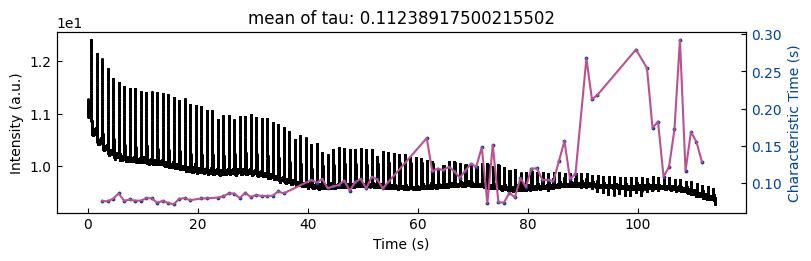

../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5 temp300


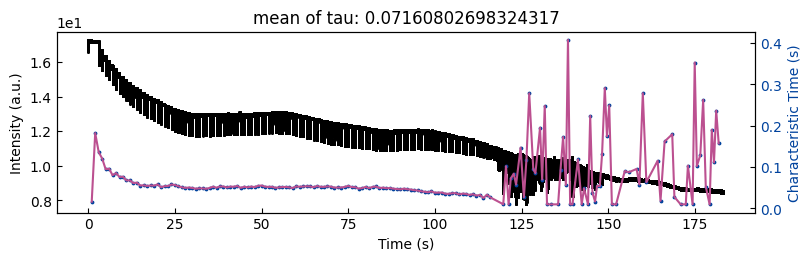

../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5 temp350


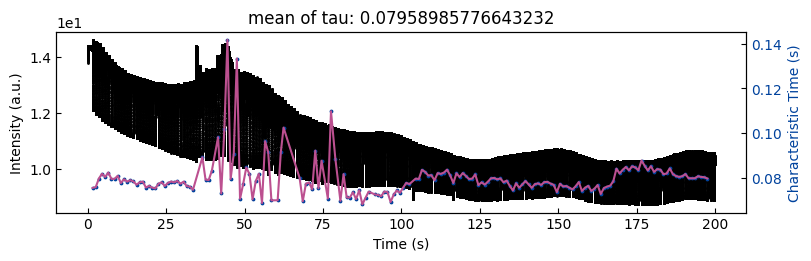

../Datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5 temp500


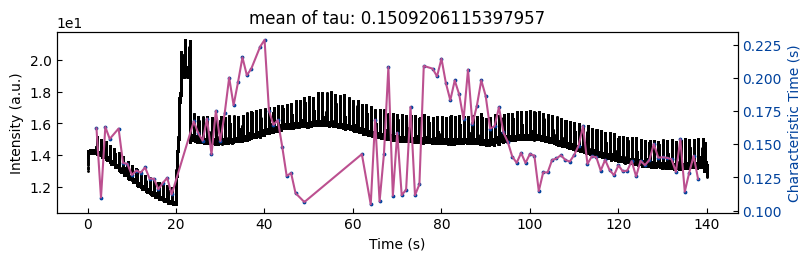

../Datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5 temp550


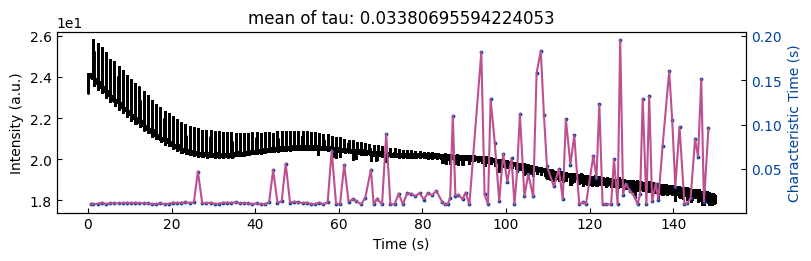

../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5 temp350


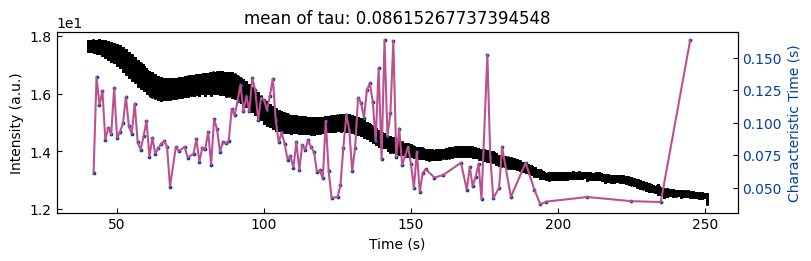

../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5 temp400


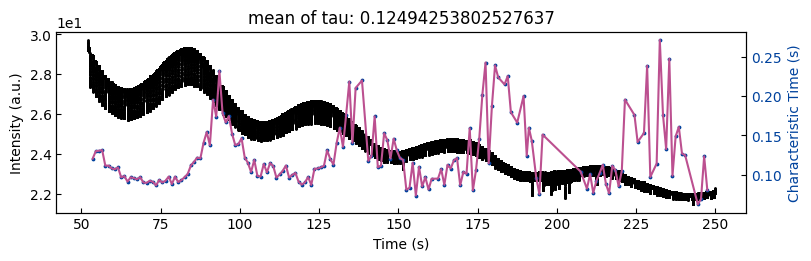

../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5 temp450


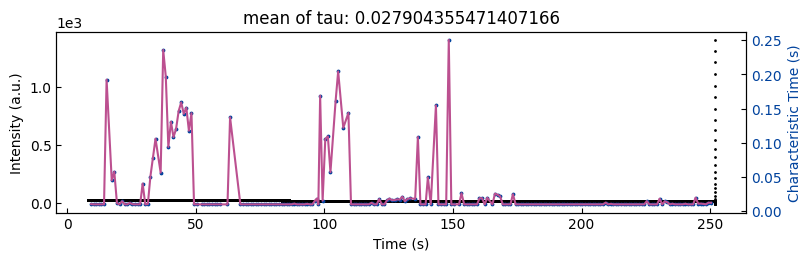

../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5 temp800


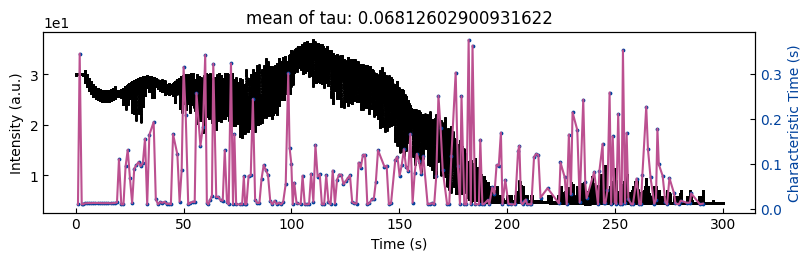

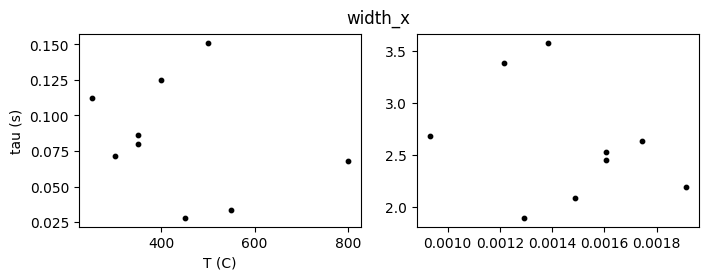

In [39]:
metric = 'width_x'
spot = 'spot_2'
viz_params = {'viz_denoise': False, 'viz_raw_curves': False, 'viz_processed_curves':False, 'viz_fittings': False, 'viz_ab': False, 'viz_tau': True, 'per_plot':5}

ys_list, tau_list  = [], []
laser_freq = 1
camera_freq_list = [2000, 2000, 2000, 2000, 2000, 1000, 1000, 1000, 1000]
ranges_list = [(0, 114), (0, 200), (0, 200), (0, 140), (0, 150), (40, 300), (52, 250), (8, 300), (0, 300)]
temp_list = ['temp250', 'temp300', 'temp350', 'temp500', 'temp550', 'temp350', 'temp400', 'temp450', 'temp800']
T_list = [250, 300, 350, 500, 550, 350, 400, 450, 800]
# denoise_params = {'savgol_window_order': (51,3), 'pca_component': 3, 'fft_cutoff_order':(20, 1), 'median_kernel_size':51}
denoise_params = {'savgol_window_order': (51, 3), 'pca_component': None, 'fft_cutoff_order':(5, 1), 'median_kernel_size':51}
normalize_params = {'I_diff': None, 'unify':True, 'bounds':[0.01, 1], 'p_init':(1, 0.1, 0.4), 'n_std':1}

para_path_list= ['../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5',
                 '../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5',
                 '../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5',
                 '../Datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5',
                 '../Datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5',
                 '../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5',
                 '../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5',
                 '../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5',
                 '../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5']
curve_params = {'trim_first':0, 'tune_tail':True, 'convolve_step':15, 'prominence':0.2, 'mode':'valid', 'linear_ratio':0.8}
    

for temp, ranges, para_path, camera_freq in zip(temp_list, ranges_list, para_path_list, camera_freq_list):
    ds_para = RHEED_parameter_dataset(para_path, camera_freq=camera_freq, sample_name='J14')

    print(para_path, temp)
    sample_x, sample_y = ds_para.load_curve(growth=temp, spot=spot, metric=metric, x_start=0)
    data = np.stack([sample_x, sample_y], 1)
    data = select_range(data, *ranges)

    parameters_all, x_list_all, info, tau = analyze_rheed_data(data, camera_freq, laser_freq, denoise_params, curve_params, normalize_params, viz_params)
    [xs_all, ys_all, ys_fit_all, ys_nor_all, ys_nor_fit_all, ys_nor_fit_failed_all, labels_all, losses_all] = info
    xs, ys = collect_data(ys_nor_all, mean_length=2000, viz=False)
    ys_list.append(ys)
    tau_list.append(tau)

tau_mean_list = np.array([np.mean(tau) for tau in tau_list])
plot_activation_energy(T_list, tau_mean_list, fit=False, title=metric, save_path=f'../Saved_data/{metric}.png')

### metric: width_y

../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5 temp250


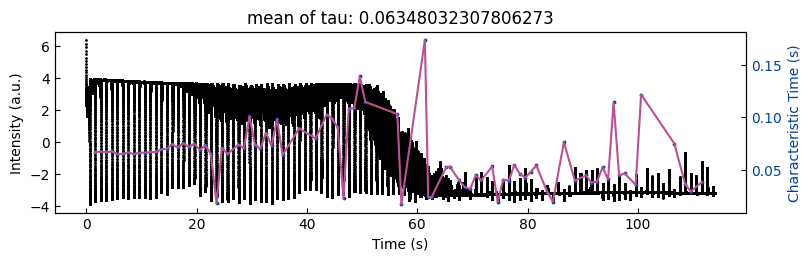

../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5 temp300


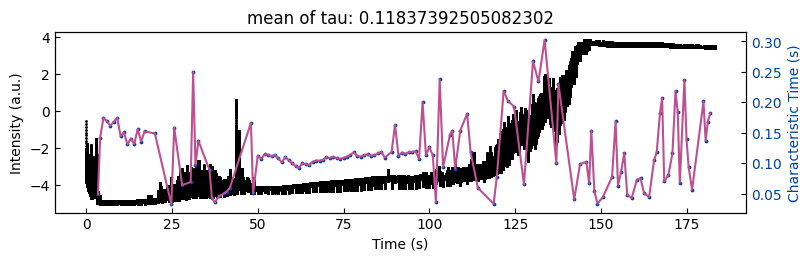

../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5 temp350


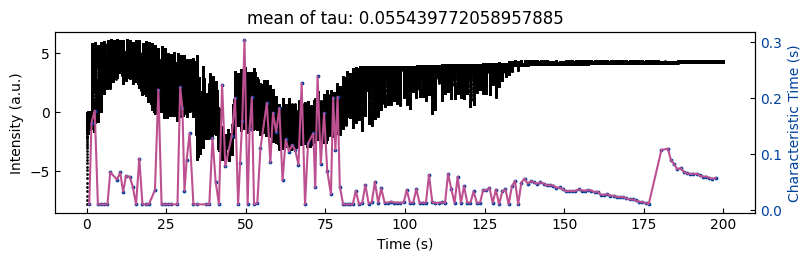

../Datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5 temp500


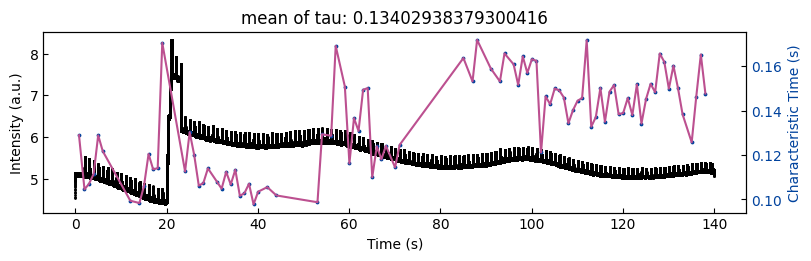

../Datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5 temp550


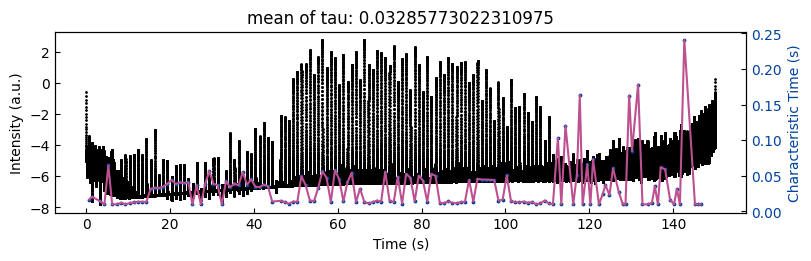

../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5 temp350


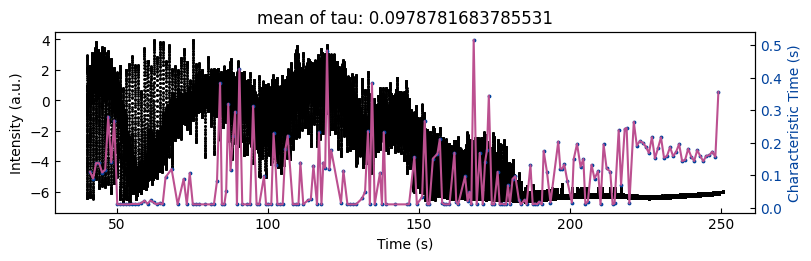

../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5 temp400


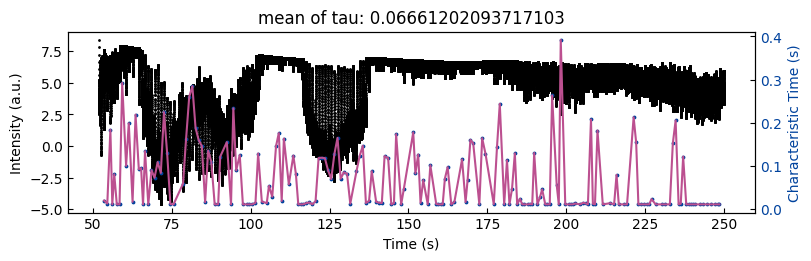

../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5 temp450


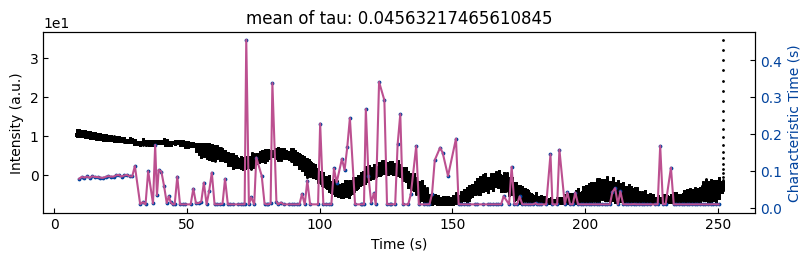

../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5 temp800


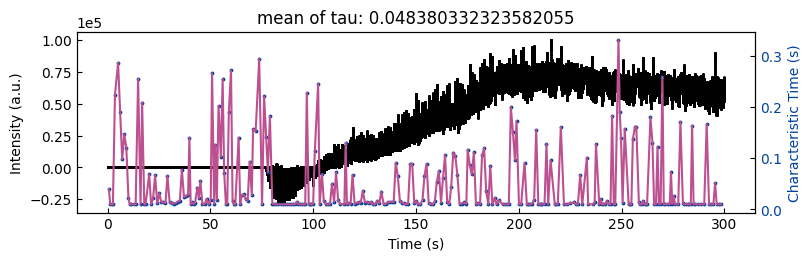

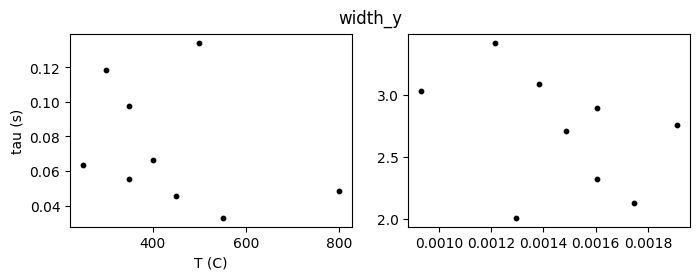

In [40]:
metric = 'width_y'
spot = 'spot_2'
viz_params = {'viz_denoise': False, 'viz_raw_curves': False, 'viz_processed_curves':False, 'viz_fittings': False, 'viz_ab': False, 'viz_tau': True, 'per_plot':5}

ys_list, tau_list  = [], []
laser_freq = 1
camera_freq_list = [2000, 2000, 2000, 2000, 2000, 1000, 1000, 1000, 1000]
ranges_list = [(0, 114), (0, 200), (0, 200), (0, 140), (0, 150), (40, 300), (52, 250), (8, 300), (0, 300)]
temp_list = ['temp250', 'temp300', 'temp350', 'temp500', 'temp550', 'temp350', 'temp400', 'temp450', 'temp800']
T_list = [250, 300, 350, 500, 550, 350, 400, 450, 800]
# denoise_params = {'savgol_window_order': (51,3), 'pca_component': 3, 'fft_cutoff_order':(20, 1), 'median_kernel_size':51}
denoise_params = {'savgol_window_order': (51, 3), 'pca_component': None, 'fft_cutoff_order':(5, 1), 'median_kernel_size':51}
normalize_params = {'I_diff': None, 'unify':True, 'bounds':[0.01, 1], 'p_init':(1, 0.1, 0.4), 'n_std':1}

para_path_list= ['../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5',
                 '../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5',
                 '../Datasets/J14_PM04_05_06_gaussian_fit_parameters_10022023.h5',
                 '../Datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5',
                 '../Datasets/J14_PM08_09_10_gaussian_fit_parameters_08272023.h5',
                 '../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5',
                 '../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5',
                 '../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5',
                 '../Datasets/J14_PM11_12_14_17_gaussian_fit_parameters.h5']
curve_params = {'trim_first':0, 'tune_tail':True, 'convolve_step':15, 'prominence':0.2, 'mode':'valid', 'linear_ratio':0.8}
    

for temp, ranges, para_path, camera_freq in zip(temp_list, ranges_list, para_path_list, camera_freq_list):
    ds_para = RHEED_parameter_dataset(para_path, camera_freq=camera_freq, sample_name='J14')

    print(para_path, temp)
    sample_x, sample_y = ds_para.load_curve(growth=temp, spot=spot, metric=metric, x_start=0)
    data = np.stack([sample_x, sample_y], 1)
    data = select_range(data, *ranges)

    parameters_all, x_list_all, info, tau = analyze_rheed_data(data, camera_freq, laser_freq, denoise_params, curve_params, normalize_params, viz_params)
    [xs_all, ys_all, ys_fit_all, ys_nor_all, ys_nor_fit_all, ys_nor_fit_failed_all, labels_all, losses_all] = info
    xs, ys = collect_data(ys_nor_all, mean_length=2000, viz=False)
    ys_list.append(ys)
    tau_list.append(tau)

tau_mean_list = np.array([np.mean(tau) for tau in tau_list])
plot_activation_energy(T_list, tau_mean_list, fit=False, title=metric, save_path=f'../Saved_data/{metric}.png')